In [1]:
# Aquí crido l'script que t'he deixat al directori /home/anoguera/scripts/src/globalFunctionsAina.R
source("/home/anoguera/scripts/src/globalFunctionsAina.R")

phs <- fread('/home/anoguera/Data/tableGenesHtmlRefereeCorrected.tab') %>% filter(chr != 'chrX')

Warning message:
“replacing previous import ‘lifecycle::last_warnings’ by ‘rlang::last_warnings’ when loading ‘tibble’”
Warning message:
“replacing previous import ‘vctrs::data_frame’ by ‘tibble::data_frame’ when loading ‘dplyr’”

Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



Attaching package: ‘data.table’


The following objects are masked from ‘package:dplyr’:

    between, first, last


── Attaching packages ──────────────────────────────────────────────────────────── tidyverse 1.3.0 ──

✔ ggplot2 3.3.6     ✔ purrr   0.3.4
✔ tibble  3.0.1     ✔ stringr 1.4.0
✔ tidyr   1.1.0     ✔ forcats 0.5.0
✔ readr   1.3.1     

── Conflicts ─────────────────────────────────────────────────────────────── tidyverse_conflicts() ──
✖ data.table::between() masks dplyr::between()
✖ dplyr::filter()       masks stats::filter()
✖ data.table::first()  

# Creació de la taula

### Generar la taula

In [2]:
#Aquesta funció et retorna la taula desitjada on dona les edats d'una variant significativa en una metapoblació, FILTRANT LES 15 VARIANTS AMB MAJOR ISAFE A CADA POBLACIÓ
#si no són significativament diferents les unes respecte a les altres en les diferents poblacions
#Es consideren significatives puntuacions d'iSAFE >0.1 i edats de variants amb qualitat >0.5
#No hi ha cap nombre mínim de variants significatives d'iSAFE per filtrar
variantage_table_kw <- function(taula_regions = fread("/home/anoguera/Data/iHS_selected_regions.csv") %>% filter(CHR != 23), AFR = AFRpops, EAS = EASpops, EUR = EURpops, SAS = SASpops) {
    #Valors mínims dels estadístics per filtrar (per canviar si fa falta)
    min_iSAFE <- 0.1
    #Afegeixo a la taula les columnes amb la informació que m'interessa: isafe max, age median, age sd i num de variants (amb iSAFE significant), i metapop i region, que ja es pot omplir
    taula_regions <- taula_regions %>% select(POP, CHR, START_POS, STOP_POS, TAG_RS) %>% arrange(CHR) %>% #Ordeno per chr per obrir cada arxiu de chr un sol cop
        mutate(isafe_max = as.numeric(NA), age_median = as.numeric(NA), age_sd = as.numeric(NA), num_var = as.numeric(NA), 
               METAPOP = case_when(POP %in% AFR ~ 'AFR', POP %in% EUR ~ 'EUR',  POP %in% EAS ~ 'EAS', POP %in% SAS ~ 'SAS', TRUE ~ 'AMR'), 
               REGION = paste(CHR, START_POS, STOP_POS, sep = ':'))
    #Ara faig aquesta iteració per a cada regió de la taula
    last_chr <- 0 #Faig això per comprovar si el chr és el mateix que l'anterior
    allele_ages <- data.table() #Per poder borrar-ho després de cada chr
    for (n in 1:nrow(taula_regions)) {
        pos_inici <- taula_regions$START_POS[n]
        pos_final <- taula_regions$STOP_POS[n]
        chr <- taula_regions$CHR[n]
        print(n)
        #En aquest cas també ens hem de quedar amb la pop actual
        pop_actual <- taula_regions$POP[n]
        #Agafo la regió d'iSAFE de la taula i em quedo només amb la població d'interés i filtro que no sigui NA
        isafe <- sqlToDf(chr, pos_inici, pos_final, 'isafe') %>% select('physicalPos', 'rsid', pop_actual) %>% rename('isafe' = pop_actual) %>% filter(!is.na(isafe))
        if (nrow(isafe) == 0) {
            taula_regions[n, 'CAUSE'] <- 'NVi' #No hi ha variants amb informació d'iSAFE per la població en la regió
            next
        }
        #Obro la taula de les edats, però si el chr és el mateix que l'anterior, ja està oberta
        if (chr != last_chr) {
            rm(allele_ages)
            print(chr)

            path <- paste0('/home/anoguera/Data/relate_ages/allele_ages_chr', chr, '.csv')
            allele_ages <- fread(path) %>% select(BP, pop, lower_age, upper_age)
            last_chr <- chr
        }
        warning()
        #Ajunto la regió corresponent de la taula allele_ages per la població actual amb la taula d'isafe
        merged <- merge(isafe, allele_ages %>% filter(pop == pop_actual & BP >= pos_inici & BP <= pos_final), by.x = c('physicalPos'), by.y = c('BP'))
        #Si no hi ha cap variant d'aquella raegió a relate que solapi amb les d'iSAFE, ja es pot acabar la iteració per la regió, i l'afegeixo a la taula
        if (nrow(merged) == 0) {
            taula_regions[n,"CAUSE"] <- 'NVr' #No variants a relate
            next
        }
        #Em quedo només amb les variants significatives d'iSAFE (i em quedo amb les 15 superiors) i calculo l'edat de les variants fent la mitjana entre l'estima superior i inferior
        merged <- merged %>% filter(isafe >= min_iSAFE) %>% slice_max(isafe, n=5) %>% mutate(age = 0.5*(lower_age + upper_age)) 
        #Si alguna regió no té cap valor significatiu d'iSAFE, ho poso a la taula i passo a la següent regió
        if (nrow(merged) == 0) {
            taula_regions[n,"CAUSE"] <- 'N.S.' #No hi ha valors significatius d'iSAFE a la regió/població
            next
        }
        #Ara guardem les dades que necessitem per la població i regió en una taula
        dades <- merged %>% summarise(isafe_max = max(isafe), age_median = median(age), age_sd = sd(age), num_var = n())
        #No hi ha mínim de variants amb iSAFe significatiu, així que algunes regions/poblacions no podran calcular l'sd (1 sola variant)
        #Ara a taula_temp tinc 4 columnes amb la seva informació, i ho afegeixo a la taula principal. Cada fila té aquests 4 valors a afegir:
        for (columna in c('isafe_max', 'age_median', 'age_sd', 'num_var')) {
            #Accedeixo a la posició de la taula que cal modificar
            taula_regions[n,columna] <- dades[1, columna]
        }
    }
    rm(allele_ages)
    return(taula_regions)
}

In [ ]:
resultat <- variantage_table_kw()
head(resultat)

In [64]:
resultat <- fread("/home/anoguera/Data/taula_regions_ihs_top5.csv", na.strings = '')

In [70]:
head(resultat)

POP,CHR,START_POS,STOP_POS,TAG_RS,isafe_max,age_median,age_sd,num_var,METAPOP,REGION,CAUSE
<chr>,<int>,<int>,<int>,<chr>,<dbl>,<dbl>,<dbl>,<int>,<chr>,<chr>,<chr>
ACB,1,1064535,1245986,rs150656440,NA,NA,NA,NA,AFR,1:1064535:1245986,NVi
ACB,1,1894227,2009566,rs138111892,NA,NA,NA,NA,AFR,1:1894227:2009566,NVi
ACB,1,12641037,12793257,rs150993303,NA,NA,NA,NA,AFR,1:12641037:12793257,N.S.
ACB,1,14343013,14507057,rs143495242,NA,NA,NA,NA,AFR,1:14343013:14507057,N.S.
ACB,1,16821422,17003851,rs11260841,NA,NA,NA,NA,AFR,1:16821422:17003851,N.S.
ACB,1,17227616,17338460,rs192431776,NA,NA,NA,NA,AFR,1:17227616:17338460,N.S.


# Filtre dels resultats interessants

## Taules

In [71]:
#A aquesta funció se li dona el resultat de variantage_table i filtra aquelles regions que són d'interès
#(en el sentit que es pugui estimar una edat per al sweep selectiu)
#Es pot triar quin és el p_valor a partir del qual es consideren diferències significatives al cridar la funció
variantage_table_filter <- function(variantage_table_result, sign_level = 0.05) {
    #Filtro les files on cap de les metapoblacions tingui un resultat interessant:
    #Que s'hagi fet un test ANOVA i no hagi sortit significatiu per al menys una de les metapoblacions
    variantage_table_result <- variantage_table_result %>% filter(!is.na(age_median))
    #Aquests as.numeric() de sobre causen warnings pero justament m'interessa que si son strings es converteixin en NA per filtrar
    return(variantage_table_result)
}

In [72]:
resultats_filtrats <- variantage_table_filter(resultat)
print(nrow(resultats_filtrats))
head(resultats_filtrats)

[1] 4038


POP,CHR,START_POS,STOP_POS,TAG_RS,isafe_max,age_median,age_sd,num_var,METAPOP,REGION,CAUSE
<chr>,<int>,<int>,<int>,<chr>,<dbl>,<dbl>,<dbl>,<int>,<chr>,<chr>,<chr>
ACB,1,32393578,32576662,rs6674113,0.10625,26952.650,7570.356,2,AFR,1:32393578:32576662,NA
ACB,1,41642871,41742800,rs12135838,0.18222,13108.465,3580.466,5,AFR,1:41642871:41742800,NA
ACB,1,98064363,98276483,rs4970716,0.15284,13779.205,4691.640,6,AFR,1:98064363:98276483,NA
ACB,1,101391568,101520870,rs58234233,0.11563,10780.935,3766.222,7,AFR,1:101391568:101520870,NA
ACB,1,145551829,145641075,rs4388643,0.11774,11745.545,1771.688,5,AFR,1:145551829:145641075,NA
ACB,1,155649825,155777271,rs1765283,0.11806,1707.765,1852.082,4,AFR,1:155649825:155777271,NA


## Representació de les desviacions típiques

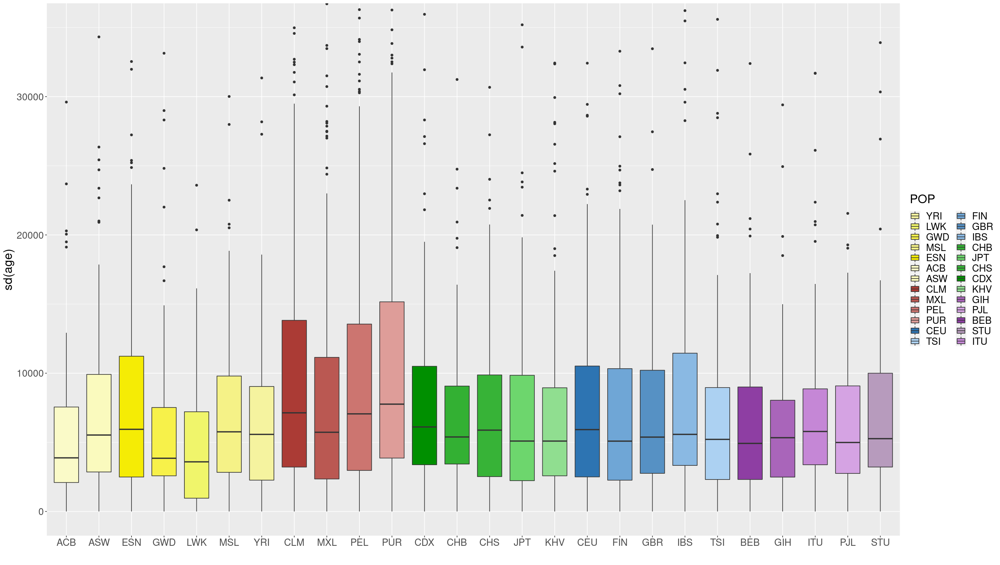

In [8]:
options(repr.plot.width = 23, repr.plot.height = 13, warn = 1)
resultats_filtrats %>% arrange(METAPOP) %>% replace_na(list(age_sd = 0)) %>%
    ggplot(mapping = aes(x = factor(POP, levels=unique(POP)), y = age_sd, fill = POP)) + 
    geom_boxplot()+ scale_fill_manual(values = popPal) + coord_cartesian(ylim = c(0, 35000)) +
    theme(text = element_text(size = 20)) + labs(x= '', y = 'sd(age)')

## Representació de les edats detectades

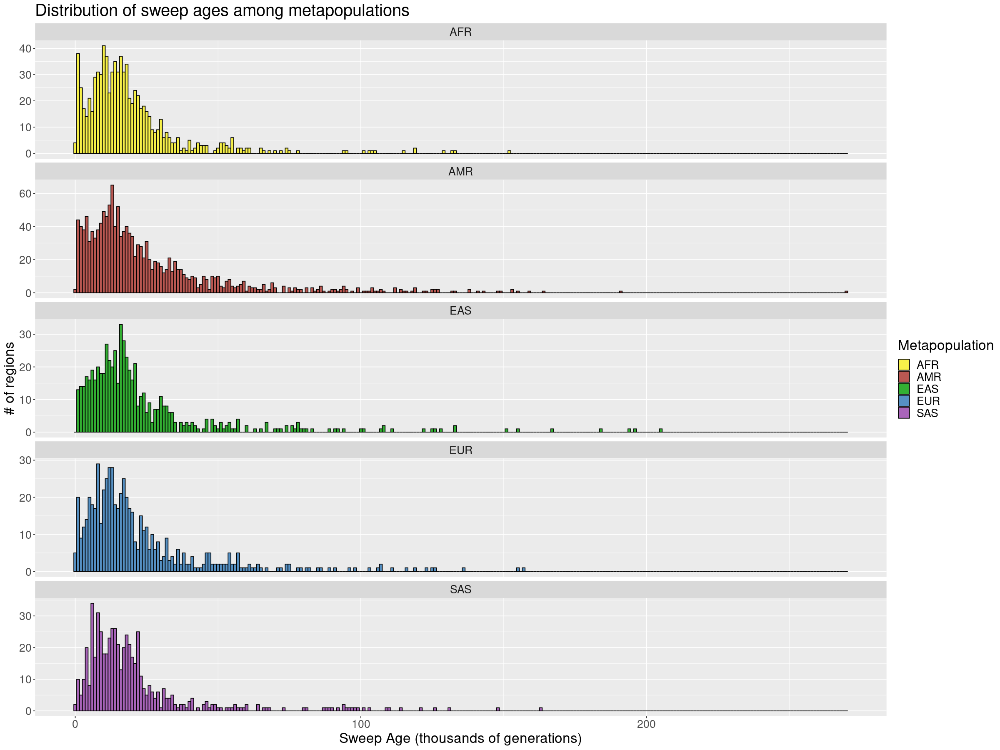

In [76]:
###HISTOGRAMA per representar les mitjanes estimades de les edats dels sweeps selectius per cada metapoblació
options(repr.plot.width = 20, repr.plot.height = 15, warn = 1)
resultats_filtrats %>% ggplot(mapping = aes(x = age_median/1000, fill = METAPOP)) + geom_histogram(binwidth = 1, color = 'black') +
    labs(x= 'Sweep Age (thousands of generations)', y = '# of regions', title = 'Distribution of sweep ages among metapopulations') +
    scale_fill_manual(values = c("#F7F14A", "#BA5852","#33B033", "#5691C4", "#A965BA"), name = 'Metapopulation') + theme(text = element_text(size = 20)) +
    facet_wrap(~METAPOP, ncol = 1, scales = 'free_y')

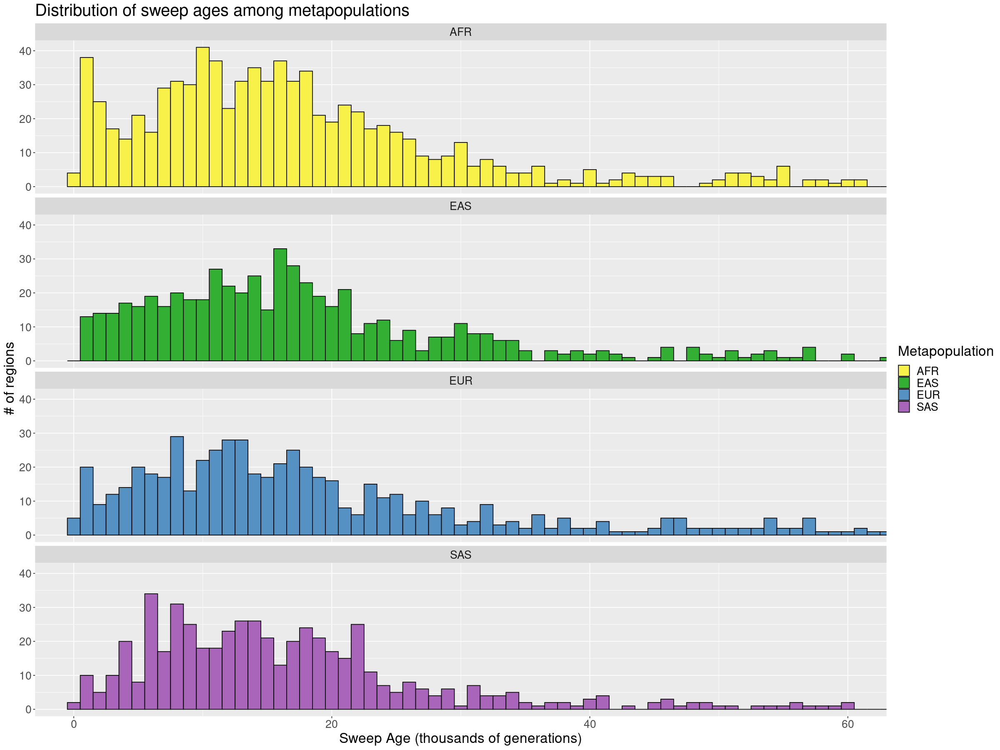

In [73]:
###HISTOGRAMA per representar les mitjanes estimades de les edats dels sweeps selectius per cada metapoblació
options(repr.plot.width = 20, repr.plot.height = 15, warn = 1)
resultats_filtrats %>% filter(METAPOP != 'AMR') %>% ggplot(mapping = aes(x = age_median/1000, fill = METAPOP)) + geom_histogram(binwidth = 1, color = 'black') +
    labs(x= 'Sweep Age (thousands of generations)', y = '# of regions', title = 'Distribution of sweep ages among metapopulations') +
    scale_fill_manual(values = c("#F7F14A", "#33B033", "#5691C4", "#A965BA"), name = 'Metapopulation') + theme(text = element_text(size = 20)) +
    facet_wrap(~METAPOP, ncol = 1 ) + coord_cartesian(xlim = c(0, 60))

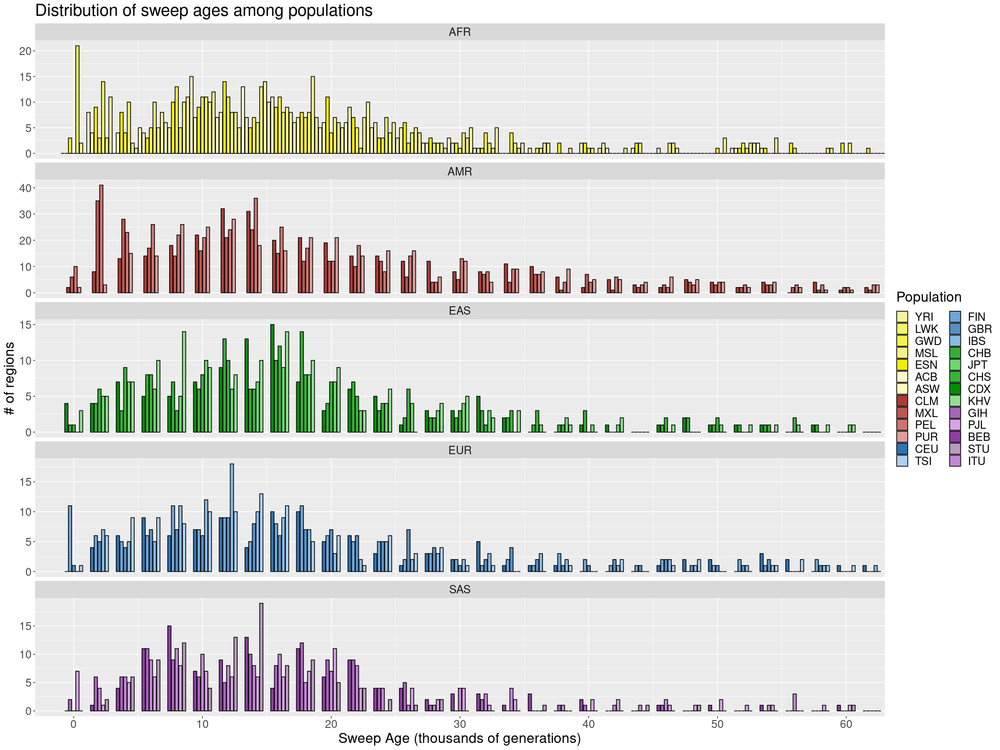

In [37]:
###HISTOGRAMA per representar les mitjanes estimades de les edats dels sweeps selectius per cada població dins de les metapoblacions
options(repr.plot.width = 20, repr.plot.height = 15, warn = 1)
resultats_filtrats %>% ggplot(mapping = aes(x = age_median/1000, fill = POP)) + geom_histogram(binwidth = 2, color = 'black', position = position_dodge2(preserve = "single")) +
    labs(x= 'Sweep Age (thousands of generations)', y = '# of regions', title = 'Distribution of sweep ages among populations') + 
    scale_fill_manual(values = popPal, name = 'Population') + theme(text = element_text(size = 20)) +
    facet_wrap(~METAPOP, ncol = 1, scales = 'free_y') + scale_x_continuous(breaks = c(0:33)*10) + coord_cartesian(xlim = c(0, 60))

### Diagrama dels resultats descartats

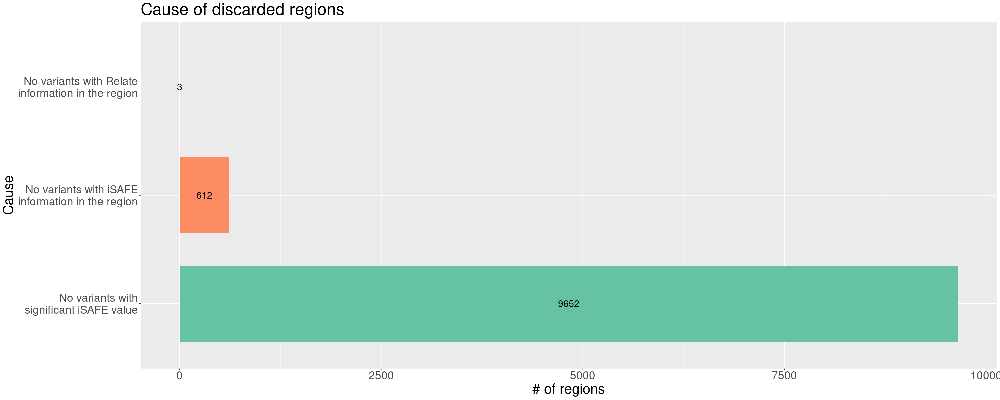

In [9]:
#Representació de les causes per les quals es descarten les altres regions de PHS en l'anàlisi
options(repr.plot.width = 25, repr.plot.height = 10, warn = 1)
resultat %>% filter(!is.na(CAUSE)) %>% ggplot(mapping = aes(y = CAUSE, fill = CAUSE)) + geom_bar(width = 0.7, show.legend = FALSE) +
    labs(x= '# of regions', y = 'Cause', title = 'Cause of discarded regions') + 
    theme(text = element_text(size = 25)) + scale_y_discrete(labels= c("NVi" = "No variants with iSAFE\ninformation in the region", "NVr" = "No variants with Relate\ninformation in the region",
                                                                       "N.S." = "No variants with\nsignificant iSAFE value"),
                                                            limits = c("N.S.","NVi", "NVr")) +
    stat_count(geom = "text", colour = "black", size = 6, aes(label = ..count..),position=position_stack(vjust=0.5)) + scale_fill_brewer(palette="Set2")

# Gene Ontology Enrichment Analysis

### Obtenció de les regions de cada rang d'edats

In [101]:
#Aquesta funció obté, a partir de la taula de resultats filtrats, una taula amb les regions seleccionades en cada interval determinat 
#No fa falta assegurar que les regions no solapin entre poblacions perquè gprofiler ja agafa cada gen un sol cop
metapop_genelist <- function(resultats_filtrats) {
    vect = c(0:70) * 1000 #Arribo fins a 70000 en intervals de 1000
    vector_ages <- vector()
    for (n in 2:length(vect)) {
        for (metapop in c('AFR', 'EUR', 'EAS', 'SAS', 'AMR')) {
            vector_ages <- append(vector_ages, paste0(metapop, ':', vect[n-1], '-', vect[n]))
        } #A vector_ages hi ha tots els intervals possibles
    }
    taula <- data.table(Interval = vector_ages, Regions = as.character(NA), Genes = as.character(NA)) %>% #Creo la taula on s'afegirà tot
        separate(Interval, sep = ':', into = c('Metapop', 'Interval'))
    for (n in 1:nrow(taula)) {
        metapop <- taula$Metapop[n]
        age_min <- as.numeric(unlist(strsplit(taula$Interval[n], '-'))[1])
        age_max <- as.numeric(unlist(strsplit(taula$Interval[n], '-'))[2])
        resultats_temp <- resultats_filtrats %>% filter(METAPOP == metapop & age_median >= age_min & age_median < age_max)
        if (nrow(resultats_temp) == 0) {
            next
        }
        taula[n,'Regions'] <- paste(resultats_temp$REGION, collapse =',')
    }
    return(taula %>% filter(!is.na(Regions)) %>% separate_rows(Regions, sep=','))
}
genes_table <- metapop_genelist(resultats_filtrats) 

In [103]:
dput(genes_table, file = "/home/anoguera/scripts/src/genes_list_ihs_regions1000_top5.R")

In [12]:
############ANTIQUAT

#Aquesta funció obté, a partir de la taula de resultats filtrats, una llista amb les regions seleccionades en cada interval determinat 
#No fa falta assegurar que les regions no solapin entre poblacions perquè gprofiler ja agafa cada gen un sol cop
metapop_genelist <- function(resultats_filtrats) {
    vect = c(0:70) * 1000 #Arribo fins a 70000 en intervals de 1000
    taula <- data.table()
    for (n in 2:length(vect)) {
        interval <- paste(vect[n-1], vect[n], sep ='-')
        for (metapop in c('AFR', 'EUR', 'EAS', 'SAS', 'AMR')) {
            taula_temp <- resultats_filtrats %>% filter(METAPOP == metapop & age_median >= vect[n-1] & age_median < vect[n])
            if (nrow(taula_temp) != 0) {
                llista[[paste(metapop, interval, sep=':')]] <- taula_temp$REGION
            }
        }
    }
    return(llista)
}

In [13]:
genes_list <- metapop_genelist(resultats_filtrats)

In [78]:
print(genes_list[['AMR:69000-70000']])

[1] "3:7031247:7224780"      "4:102168707:102424786"  "5:3006998:3158189"     
[4] "7:38208121:38354196"    "10:121857401:122006956" "12:45548916:45667519"  


## GO amb gprofiler2 (per la terminal)

In [13]:
install.packages('gprofiler2')

Installing package into ‘/home/anoguera/R/x86_64-redhat-linux-gnu-library/3.6’
(as ‘lib’ is unspecified)

also installing the dependency ‘RCurl’


Warning message in install.packages("gprofiler2"):
“installation of package ‘RCurl’ had non-zero exit status”
Warning message in install.packages("gprofiler2"):
“installation of package ‘gprofiler2’ had non-zero exit status”


In [15]:
#Guardo genes_list per fer-ho servir a l'R de la terminal
dput(genes_list, file = "/home/anoguera/scripts/src/genes_list_ihs_regions1000_top5.R")

In [92]:
nrow(genes_list)

[1] 3835

In [ ]:
library(gprofiler2)
library(biomaRt)
#He d'aconseguir la llista de gens, i no de regions, perquè gprofiler treballa amb GRCh38 i les regions són amb el 37 (hg19)
#Executar a la terminal, perque es on tinc biomaRt
ensembl <- useEnsembl(biomart = 'genes', dataset = 'hsapiens_gene_ensembl', version = 'GRCh37') #Així accedeixo a la versió de hg19
print('Connected to Ensembl')
for (n in 1:nrow(genes_table)) {
    vals <- unlist(strsplit(genes_table$Regions[n], ':'))
    chr <- vals[1]
    inici <- vals[2]
    final <- vals[3]
    gens <- getBM(attributes = 'ensembl_gene_id', filters =  c('chromosome_name', 'start', 'end'), values = list(chr, inici, final), mart = ensembl) %>% pull(ensembl_gene_id)
    genes_table[n,"Genes"] <- paste(gens, collapse=',')

    print(n)
}
#Elimino les files que no tenen cap gen a la regió. Aquesta taula s'ha de guardar per poder situar després els gens en les regions
genes_table <- genes_table %>% filter(Genes != '')

#Ara ajunto tots els IDs de gens d'un mateix interval/població per poder fer el Gene Ontology
GO_table <- genes_table %>% group_by(Metapop, Interval) %>% summarise(Gene_ids = paste(Genes, collapse = ','))


In [ ]:
##Antiquat

#He d'aconseguir la llista de gens, i no de regions, perquè gprofiler treballa amb GRCh38 i les regions són amb el 37 (hg19)
#Executar a la terminal, perque es on tinc biomaRt
ensembl <- useEnsembl(biomart = 'genes', dataset = 'hsapiens_gene_ensembl', version = 'GRCh37') #Així accedeixo a la versió de hg19
print('Connected to Ensembl')
genesid_list <- list()
for (grup in names(genes_list)) {
    vect <- c()
    for (region in genes_list[[grup]]) {
        vals <- unlist(strsplit(region, ':'))
        chr <- vals[1]
        inici <- vals[2]
        final <- vals[3]
        gens <- getBM(attributes = 'ensembl_gene_id', filters =  c('chromosome_name', 'start', 'end'), values = list(chr, inici, final), mart = ensembl) %>% pull(ensembl_gene_id)
        vect <- append(vect, gens)
    }
    genesid_list[[grup]] <- unique(vect)
    print(grup)
}

In [ ]:
#A la terminal he de fer source(direcció de dalt) per obtenir la taula i després aplico això:
resultats <- gost(genes_list, organism='hsapiens', evcodes= TRUE)[['result']]
#Després guardo els resultats amb fwrite i els puc tornar a obrir aqui

In [ ]:
for (metapop in c('AFR', 'EAS', 'EUR', 'SAS', 'AMR')) {
    llista <- as.list(GO_table %>% filter(Metapop == metapop) %>% pull(Gene_ids) %>% strsplit(','))
    names(llista) <- GO_table %>% filter(Metapop == metapop) %>% pull(Interval)
    fwrite(x = gost(llista, organism='hsapiens', evcodes= TRUE)[['result']],
           file = paste0("/home/anoguera/Data/resultatsGO_regions_ihs/", metapop, "1000top5.csv"))
    print(metapop)
    rm(llista)
}

In [ ]:
#Antiquat

for (metapop in c('AFR', 'EAS', 'EUR', 'SAS', 'AMR')) {
    fwrite(x = gost(genesid_list[grep(metapop, names(genesid_list))], organism='hsapiens', evcodes= TRUE)[['result']],
           file = paste0("/home/anoguera/Data/resultatsGO_regions_ihs/", metapop, "1000top5.csv"))
    print(metapop)
}

### Resultats

In [43]:
GOresultAFR <- fread("/home/anoguera/Data/resultatsGO_regions_ihs/AFR1000top5.csv")
GOresultEUR <- fread("/home/anoguera/Data/resultatsGO_regions_ihs/EUR1000top5.csv")
GOresultEAS <- fread("/home/anoguera/Data/resultatsGO_regions_ihs/EAS1000top5.csv")
GOresultSAS <- fread("/home/anoguera/Data/resultatsGO_regions_ihs/SAS1000top5.csv")
GOresultAMR <- fread("/home/anoguera/Data/resultatsGO_regions_ihs/AMR1000top5.csv")

In [20]:
head(GOresultAFR %>% filter(intersection_size == 1))

query,significant,p_value,term_size,query_size,intersection_size,precision,recall,term_id,source,term_name,effective_domain_size,source_order,parents,evidence_codes,intersection
<chr>,<lgl>,<dbl>,<int>,<int>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>
AFR:27000-28000,TRUE,0.04994746,2,1,1,1.0,0.5,CORUM:6637,CORUM,USP46-UAF1 complex,3627,2269,CORUM:0000000,CORUM,ENSG00000109189
AFR:27000-28000,TRUE,0.04996123,1,1,1,1.0,1.0,HP:0011194,HP,EEG with series of focal spikes,4508,7629,HP:0011193,HP,ENSG00000067715
AFR:27000-28000,TRUE,0.04996123,1,1,1,1.0,1.0,HP:0040296,HP,Abnormal location of the eyebrow,4508,14528,HP:0000534,HP,ENSG00000067715
AFR:28000-29000,TRUE,0.04967062,2,2,1,0.5,0.5,CORUM:6637,CORUM,USP46-UAF1 complex,3627,2269,CORUM:0000000,CORUM,ENSG00000109189
AFR:29000-30000,TRUE,0.04967062,2,2,1,0.5,0.5,CORUM:3088,CORUM,CCND2-CDK6 complex,3627,1388,CORUM:0000000,CORUM,ENSG00000105810
AFR:29000-30000,TRUE,0.04967062,2,2,1,0.5,0.5,CORUM:3087,CORUM,CCND1-CDK6 complex,3627,1387,CORUM:0000000,CORUM,ENSG00000105810


## Representació en heat map (intervals de 1000 generacions)

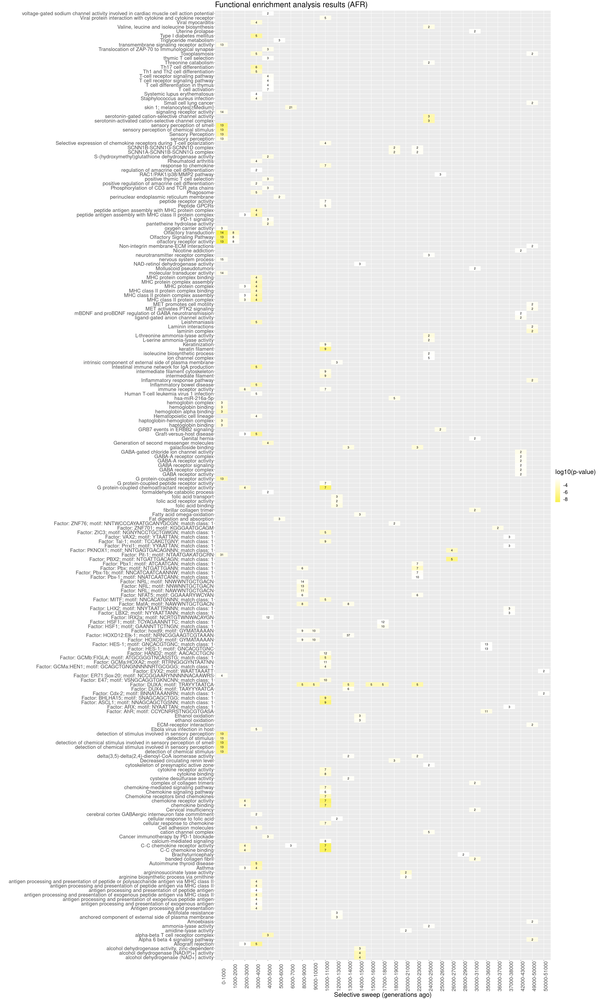

In [38]:
#Un llistat dels intervals possibles per ordenar l'eix
intervals <- c(0:100) * 1000
llistat <- c()
for (n in 2:length(intervals)) {
    llistat[n-1] <- paste(intervals[n-1], intervals[n], sep = '-') #Els as.integer són per evitar la notació científica al número 100.000
}
GOresult1000_AFR <- GOresultAFR %>% filter(p_value < 0.01) %>% separate(query, sep = ":", into = c("metapop", "generations")) %>% select(generations, p_value, intersection_size, term_name) %>% 
    unique(by = c('term_name', 'generations')) #Faig el distinct perquè, en un cas, hi ha un term (allograff_rejection) que es comparteix en varies fonts i hi ha repetició
#Em quedo amb els intervals (ordenats) on s'hagi detectat algo
llistat <- llistat[llistat %in% GOresult1000_AFR$generations]
options(repr.plot.width = 30, repr.plot.height = 50, warn = 1)
GOresult1000_AFR %>% ggplot(aes(x = generations, y = term_name)) + geom_tile(aes(fill = log10(p_value))) + 
    geom_text(aes(label = intersection_size)) +
    scale_fill_gradient(low = "#F7F14A", high = "white") +
    theme(text = element_text(size = 23), axis.text.x = element_text(angle = 90)) + 
    labs(x='Selective sweep (generations ago)', y='', title = 'Functional enrichment analysis results (AFR)', fill = 'log10(p-value)') +
    scale_x_discrete(limits = llistat)

#### Olfacte: hi ha dos clusters de gens olfactius als cromosomes 7 i 11. Hemoglobines: cluster al chr 11 (amb els d'olfacte). 
#### Receptors de quimocines: cluster al chr 3. MHC: cluster d'HLA al chr 6.

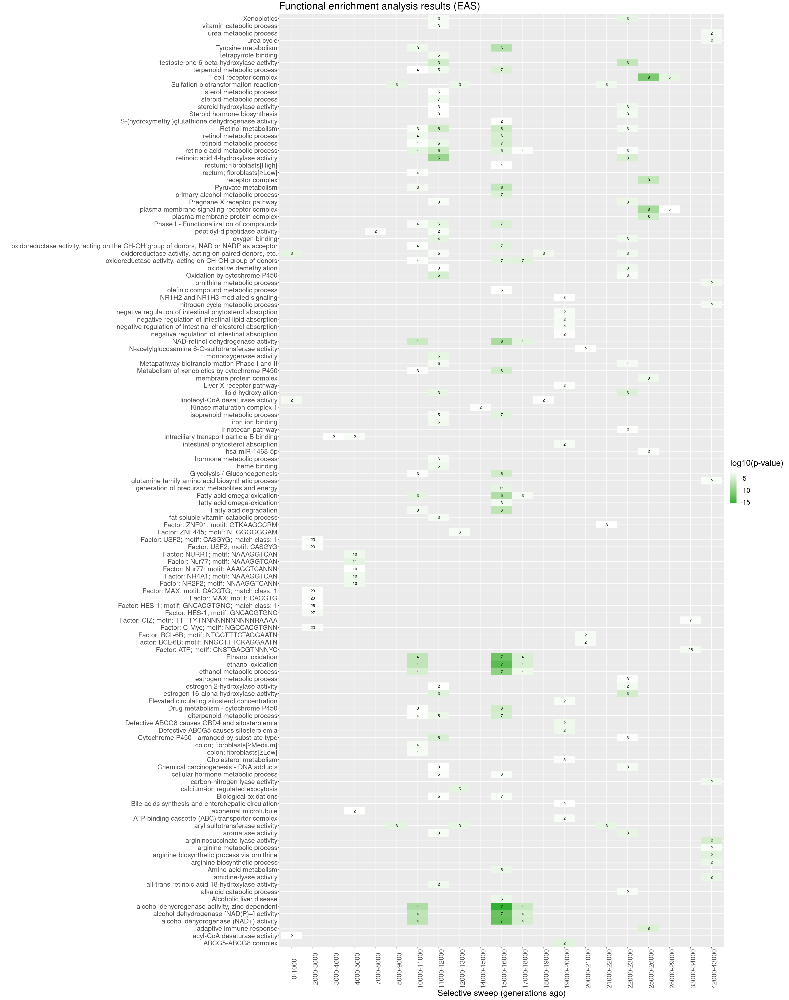

In [39]:
#Un llistat dels intervals possibles per ordenar l'eix
intervals <- c(0:100) * 1000
llistat <- c()
for (n in 2:length(intervals)) {
    llistat[n-1] <- paste(intervals[n-1], intervals[n], sep = '-') #Els as.integer són per evitar la notació científica al número 100.000
}
GOresult1000_EAS <- GOresultEAS %>% filter(p_value < 0.01) %>% separate(query, sep = ":", into = c("metapop", "generations")) %>% select(generations, p_value, intersection_size, term_name) %>% 
    unique(by = c('term_name', 'generations')) #Faig el distinct perquè, en un cas, hi ha un term (allograff_rejection) que es comparteix en varies fonts i hi ha repetició
#Em quedo amb els intervals (ordenats) on s'hagi detectat algo
llistat <- llistat[llistat %in% GOresult1000_EAS$generations]
options(repr.plot.width = 30, repr.plot.height = 38, warn = 1)
GOresult1000_EAS %>% ggplot(aes(x = generations, y = term_name)) + geom_tile(aes(fill = log10(p_value))) + 
    geom_text(aes(label = intersection_size)) +
    scale_fill_gradient(low = "#33B033", high = "white") +
    theme(text = element_text(size = 23), axis.text.x = element_text(angle = 90)) + 
    labs(x='Selective sweep (generations ago)', y='', title = 'Functional enrichment analysis results (EAS)', fill = 'log10(p-value)') +
    scale_x_discrete(limits = llistat)

#### Alcohol deshidrogenasa: cluster al chr 4. El procès metabòlic de l'àcid retinoic també és referent a aquests gens i la glicòlisi també, i el citocrom P450.

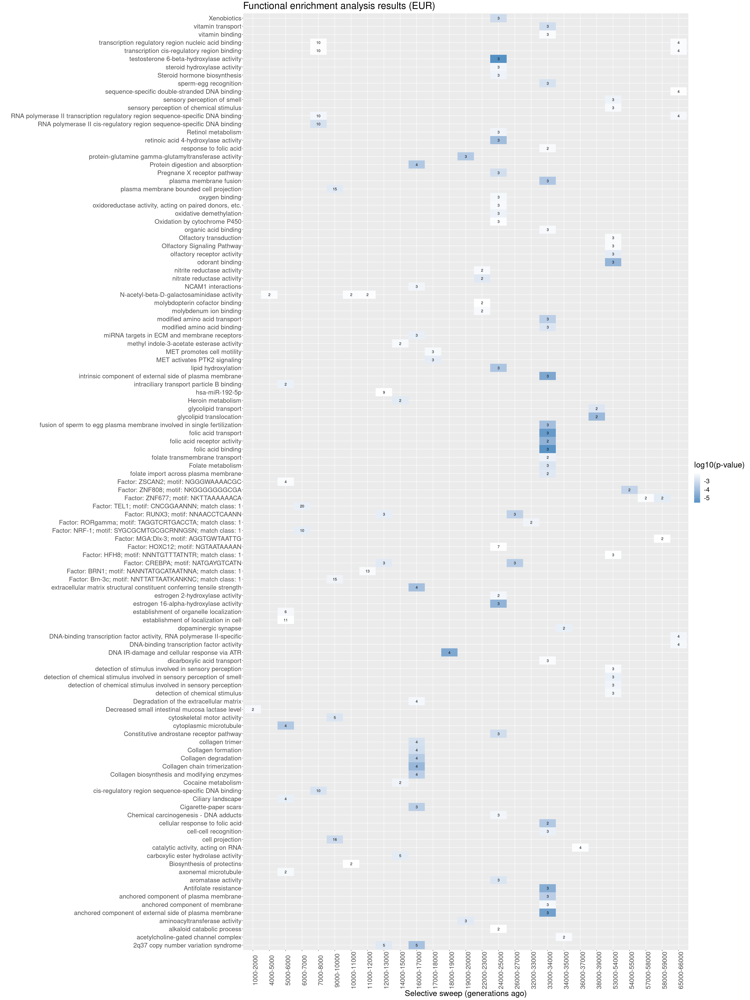

In [45]:
#Un llistat dels intervals possibles per ordenar l'eix
intervals <- c(0:100) * 1000
llistat <- c()
for (n in 2:length(intervals)) {
    llistat[n-1] <- paste(intervals[n-1], intervals[n], sep = '-') #Els as.integer són per evitar la notació científica al número 100.000
}
GOresult1000_EUR <- GOresultEUR %>% filter(p_value < 0.01) %>% separate(query, sep = ":", into = c("metapop", "generations")) %>% select(generations, p_value, intersection_size, term_name) %>% 
    unique(by = c('term_name', 'generations')) #Faig el distinct perquè, en un cas, hi ha un term (allograff_rejection) que es comparteix en varies fonts i hi ha repetició
#Em quedo amb els intervals (ordenats) on s'hagi detectat algo
llistat <- llistat[llistat %in% GOresult1000_EUR$generations]
options(repr.plot.width = 30, repr.plot.height = 40, warn = 1)
GOresult1000_EUR %>% ggplot(aes(x = generations, y = term_name)) + geom_tile(aes(fill = log10(p_value))) + 
    geom_text(aes(label = intersection_size)) +
    scale_fill_gradient(low = "#5691C4", high = "white") +
    theme(text = element_text(size = 23), axis.text.x = element_text(angle = 90)) + 
    labs(x='Selective sweep (generations ago)', y='', title = 'Functional enrichment analysis results (EUR)', fill = 'log10(p-value)') +
    scale_x_discrete(limits = llistat)

#### 4 gens estan implicats en el resultat del colàgen. COL3A1 i COL5A2 estan junts en el chr 2 (2:189837378:190057477). COL6A3 està en el chr 2 però en una regió diferent (2:238258280:238561629). COL25A1 està en el cromosoma 4 (4:110032198:110158593). Semblaria ser un resultat no causat pels clusters.
#### El resultat de la testosterone 6-beta hidroxilasa es deu a un cluster de citocroms P450 en el chr 7. Els resultats de transport d'àcid fòlic es deuen a un cluster de receptors FOLR en el chr 11. El resultat de l'olfacte és un cluster de gens olfactius en el chr 11.  

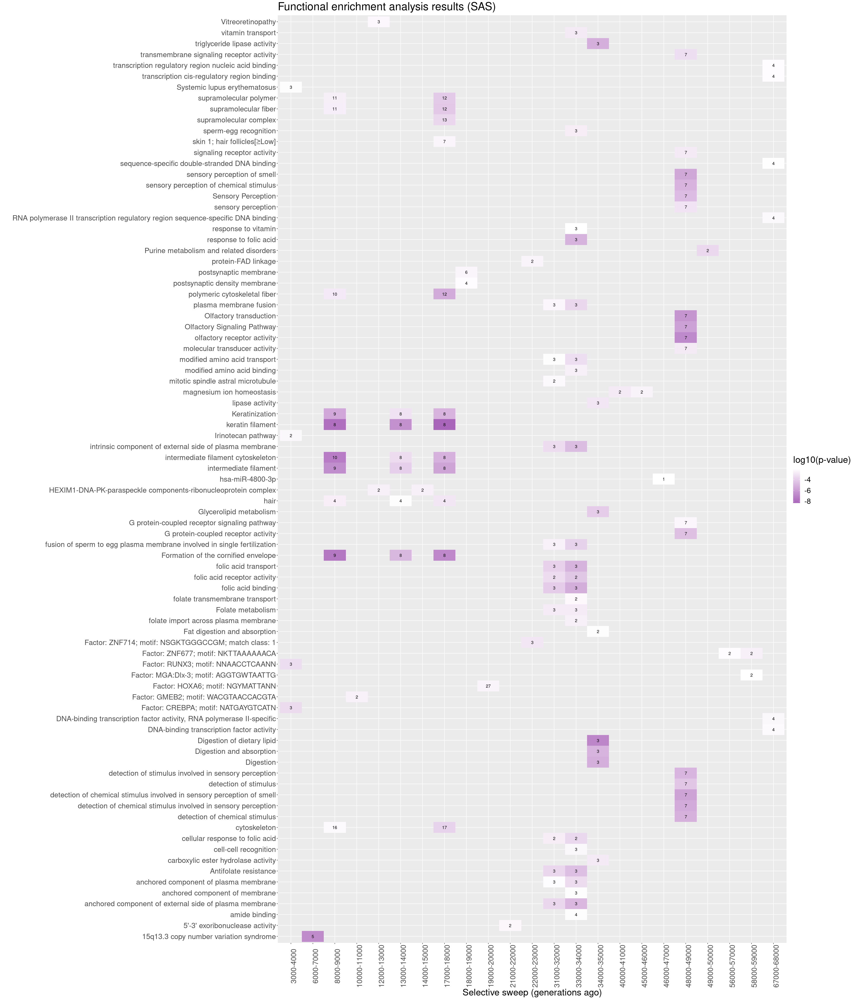

In [46]:
#Un llistat dels intervals possibles per ordenar l'eix
intervals <- c(0:100) * 1000
llistat <- c()
for (n in 2:length(intervals)) {
    llistat[n-1] <- paste(intervals[n-1], intervals[n], sep = '-') #Els as.integer són per evitar la notació científica al número 100.000
}
GOresult1000_SAS <- GOresultSAS %>% filter(p_value < 0.01) %>% separate(query, sep = ":", into = c("metapop", "generations")) %>% select(generations, p_value, intersection_size, term_name) %>% 
    unique(by = c('term_name', 'generations')) #Faig el distinct perquè, en un cas, hi ha un term (allograff_rejection) que es comparteix en varies fonts i hi ha repetició
#Em quedo amb els intervals (ordenats) on s'hagi detectat algo
llistat <- llistat[llistat %in% GOresult1000_SAS$generations]
options(repr.plot.width = 30, repr.plot.height = 35, warn = 1)
GOresult1000_SAS %>% ggplot(aes(x = generations, y = term_name)) + geom_tile(aes(fill = log10(p_value))) + 
    geom_text(aes(label = intersection_size)) +
    scale_fill_gradient(low = "#A965BA", high = "white") +
    theme(text = element_text(size = 23), axis.text.x = element_text(angle = 90)) + 
    labs(x='Selective sweep (generations ago)', y='', title = 'Functional enrichment analysis results (SAS)', fill = 'log10(p-value)') +
    scale_x_discrete(limits = llistat)

#### El resultat de l'olfacte es deu al cluster de gens olfactius del chr 7. El resultat de digestió de lípids es deu a un cluster del chr 10. Els resultats d'àcid fòlic i transport de vitamines es deuen als receptors FOLR del chr 11. 
#### El resultat de la formació del cornified envelope es deu majoritàriament a un grup de gens de queratina en el chr 12, però els casos on hi ha 9 gens implicats inclouen un altre gen, PKP4, del chr 2; i el de 10 també inclou MACF1, del chr 1. 

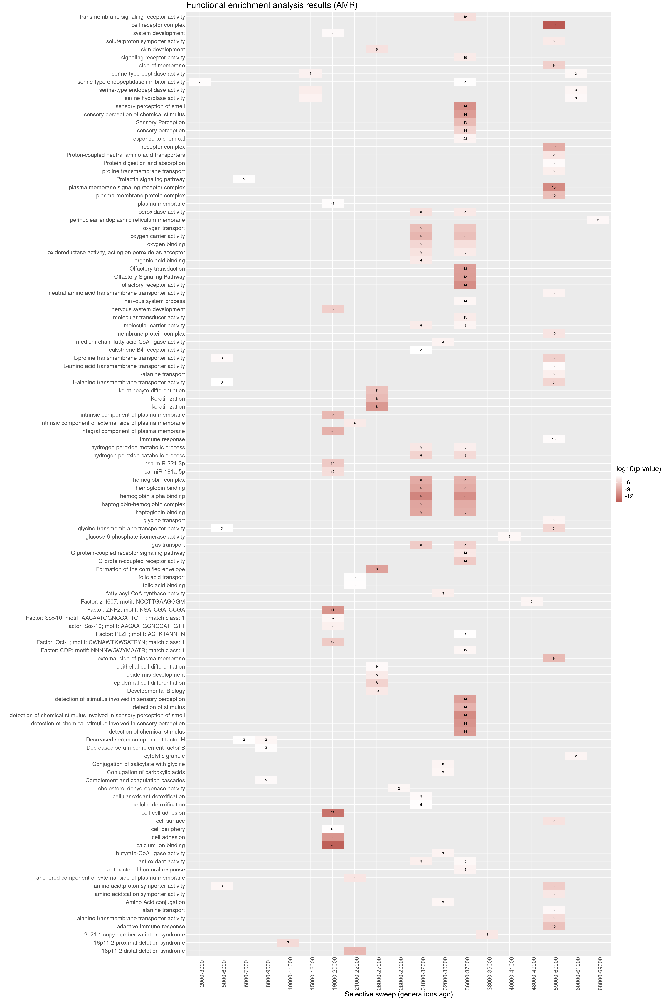

In [48]:
#Un llistat dels intervals possibles per ordenar l'eix
intervals <- c(0:100) * 1000
llistat <- c()
for (n in 2:length(intervals)) {
    llistat[n-1] <- paste(intervals[n-1], intervals[n], sep = '-') #Els as.integer són per evitar la notació científica al número 100.000
}
GOresult1000_AMR <- GOresultAMR %>% filter(p_value < 0.001 & p_value > 10**-18) %>% separate(query, sep = ":", into = c("metapop", "generations")) %>% select(generations, p_value, intersection_size, term_name) %>% 
    unique(by = c('term_name', 'generations')) #Faig el distinct perquè, en un cas, hi ha un term (allograff_rejection) que es comparteix en varies fonts i hi ha repetició
#Em quedo amb els intervals (ordenats) on s'hagi detectat algo
llistat <- llistat[llistat %in% GOresult1000_AMR$generations]
options(repr.plot.width = 30, repr.plot.height = 45, warn = 1)
GOresult1000_AMR %>% ggplot(aes(x = generations, y = term_name)) + geom_tile(aes(fill = log10(p_value))) + 
    geom_text(aes(label = intersection_size)) +
    scale_fill_gradient(low = "#BA5852", high = "white") +
    theme(text = element_text(size = 23), axis.text.x = element_text(angle = 90)) + 
    labs(x='Selective sweep (generations ago)', y='', title = 'Functional enrichment analysis results (AMR)', fill = 'log10(p-value)') +
    scale_x_discrete(limits = llistat)

#### El resultat de T-cell receptor complex es deu a un cluster de gens TRGV en el cromosoma 7.
#### El resultat de calcium ion binding es deu a un cluster gegant de gens PCDHA i PCDHB en el chr 5, tot i que també hi ha el gen SPOCK2 del chr 10 i el CDH26 del chr 20.

### Llistes dels gens per gene ontology

In [17]:
source("/home//anoguera/scripts/src/genesid_list_ihs_regions1000_top5.R")

In [18]:
print(genesid_list[['EUR:16000-17000']])

 [1] "ENSG00000137942" "ENSG00000212601" "ENSG00000137936" "ENSG00000197056"
 [5] "ENSG00000228348" "ENSG00000116560" "ENSG00000201868" "ENSG00000263591"
 [9] "ENSG00000146463" "ENSG00000240374" "ENSG00000228063" "ENSG00000216081"
[13] "ENSG00000229568" "ENSG00000168542" "ENSG00000221502" "ENSG00000204262"
[17] "ENSG00000228073" "ENSG00000264725" "ENSG00000163359" "ENSG00000222022"
[21] "ENSG00000222032" "ENSG00000115648" "ENSG00000222449" "ENSG00000071677"
[25] "ENSG00000124839" "ENSG00000234949" "ENSG00000227107" "ENSG00000124831"
[29] "ENSG00000188517" "ENSG00000249276" "ENSG00000212561" "ENSG00000250331"
[33] "ENSG00000248931" "ENSG00000251193" "ENSG00000248202" "ENSG00000249797"
[37] "ENSG00000172795" "ENSG00000171444" "ENSG00000232633" "ENSG00000202283"
[41] "ENSG00000164483" "ENSG00000164484" "ENSG00000204429" "ENSG00000229288"
[45] "ENSG00000226327" "ENSG00000252299" "ENSG00000106723" "ENSG00000227638"
[49] "ENSG00000231804" "ENSG00000231061" "ENSG00000215430" "ENSG00000226974"

## Representació en heat map (intervals solapants de 3000 generacions)

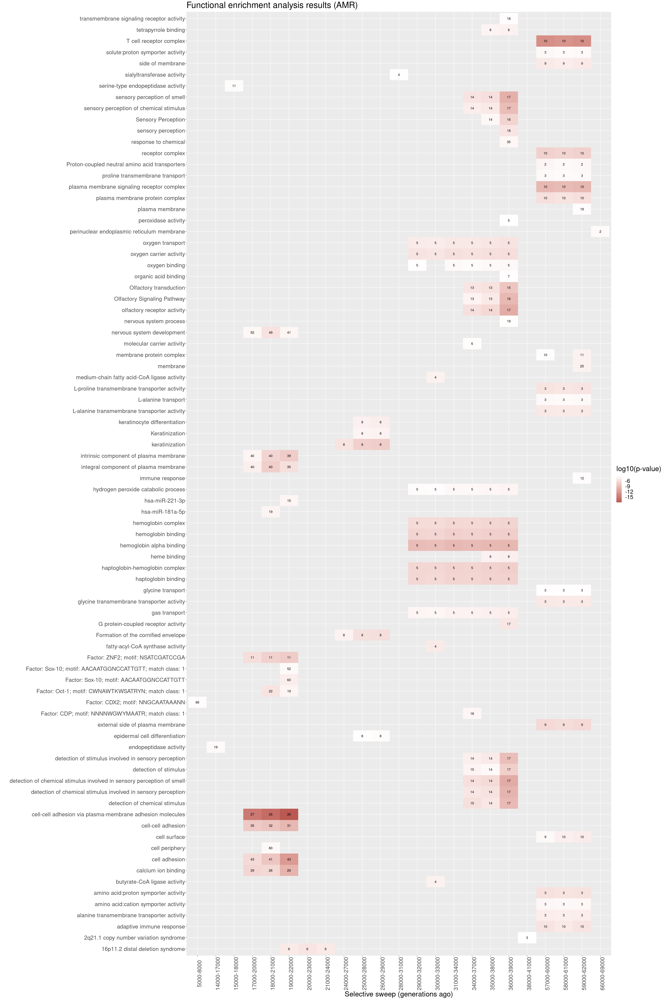

In [33]:
#Un llistat dels intervals possibles per ordenar l'eix
intervals <- c(0:100) * 1000
llistat <- c()
for (n in 4:length(intervals)) {
    llistat[n-3] <- paste(intervals[n-3], intervals[n], sep = '-') #Els as.integer són per evitar la notació científica al número 100.000
}
GOresult1000_AMR <- GOresultAMR %>% filter(p_value < 0.001 & p_value > 10**-18) %>% separate(query, sep = ":", into = c("metapop", "generations")) %>% select(generations, p_value, intersection_size, term_name) %>% 
    unique(by = c('term_name', 'generations')) #Faig el distinct perquè, en un cas, hi ha un term (allograff_rejection) que es comparteix en varies fonts i hi ha repetició
#Em quedo amb els intervals (ordenats) on s'hagi detectat algo
llistat <- llistat[llistat %in% GOresult1000_AMR$generations]
options(repr.plot.width = 30, repr.plot.height = 45, warn = 1)
GOresult1000_AMR %>% ggplot(aes(x = generations, y = term_name)) + geom_tile(aes(fill = log10(p_value))) + 
    geom_text(aes(label = intersection_size)) +
    scale_fill_gradient(low = "#BA5852", high = "white") +
    theme(text = element_text(size = 23), axis.text.x = element_text(angle = 90)) + 
    labs(x='Selective sweep (generations ago)', y='', title = 'Functional enrichment analysis results (AMR)', fill = 'log10(p-value)') +
    scale_x_discrete(limits = llistat)

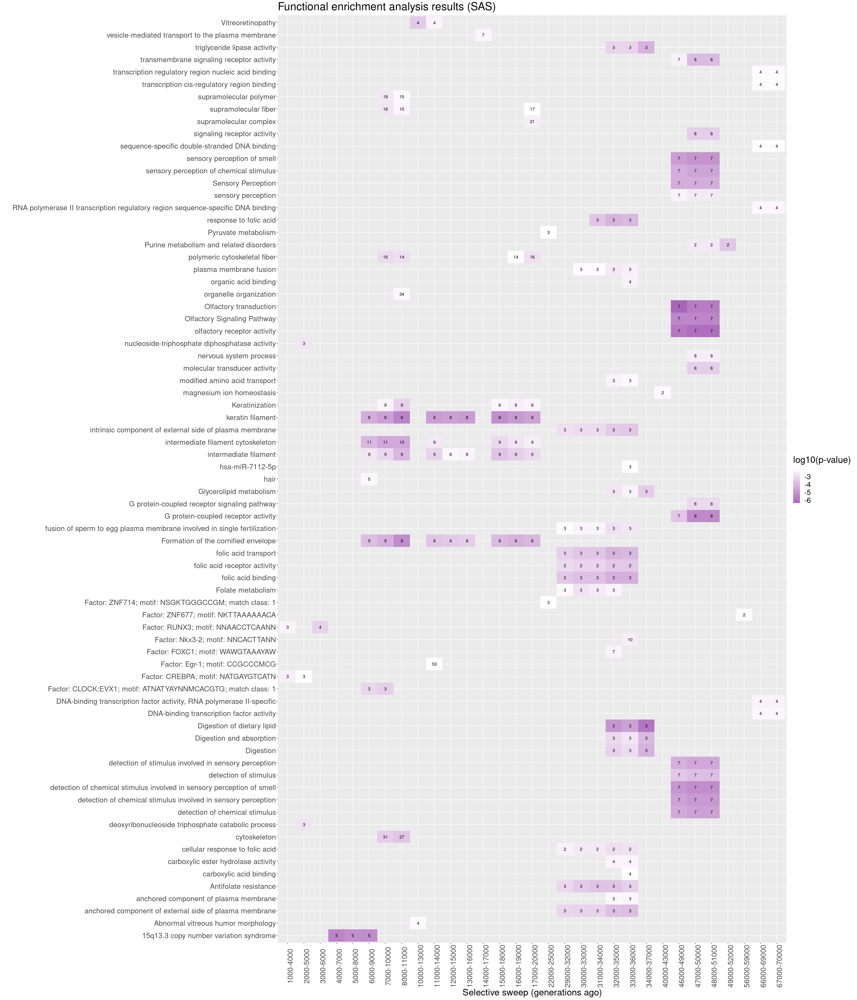

In [32]:
#Un llistat dels intervals possibles per ordenar l'eix
intervals <- c(0:100) * 1000
llistat <- c()
for (n in 4:length(intervals)) {
    llistat[n-3] <- paste(intervals[n-3], intervals[n], sep = '-') #Els as.integer són per evitar la notació científica al número 100.000
}
GOresult1000_SAS <- GOresultSAS %>% filter(p_value < 0.01) %>% separate(query, sep = ":", into = c("metapop", "generations")) %>% select(generations, p_value, intersection_size, term_name) %>% 
    unique(by = c('term_name', 'generations')) #Faig el distinct perquè, en un cas, hi ha un term (allograff_rejection) que es comparteix en varies fonts i hi ha repetició
#Em quedo amb els intervals (ordenats) on s'hagi detectat algo
llistat <- llistat[llistat %in% GOresult1000_SAS$generations]
options(repr.plot.width = 30, repr.plot.height = 35, warn = 1)
GOresult1000_SAS %>% ggplot(aes(x = generations, y = term_name)) + geom_tile(aes(fill = log10(p_value))) + 
    geom_text(aes(label = intersection_size)) +
    scale_fill_gradient(low = "#A965BA", high = "white") +
    theme(text = element_text(size = 23), axis.text.x = element_text(angle = 90)) + 
    labs(x='Selective sweep (generations ago)', y='', title = 'Functional enrichment analysis results (SAS)', fill = 'log10(p-value)') +
    scale_x_discrete(limits = llistat)

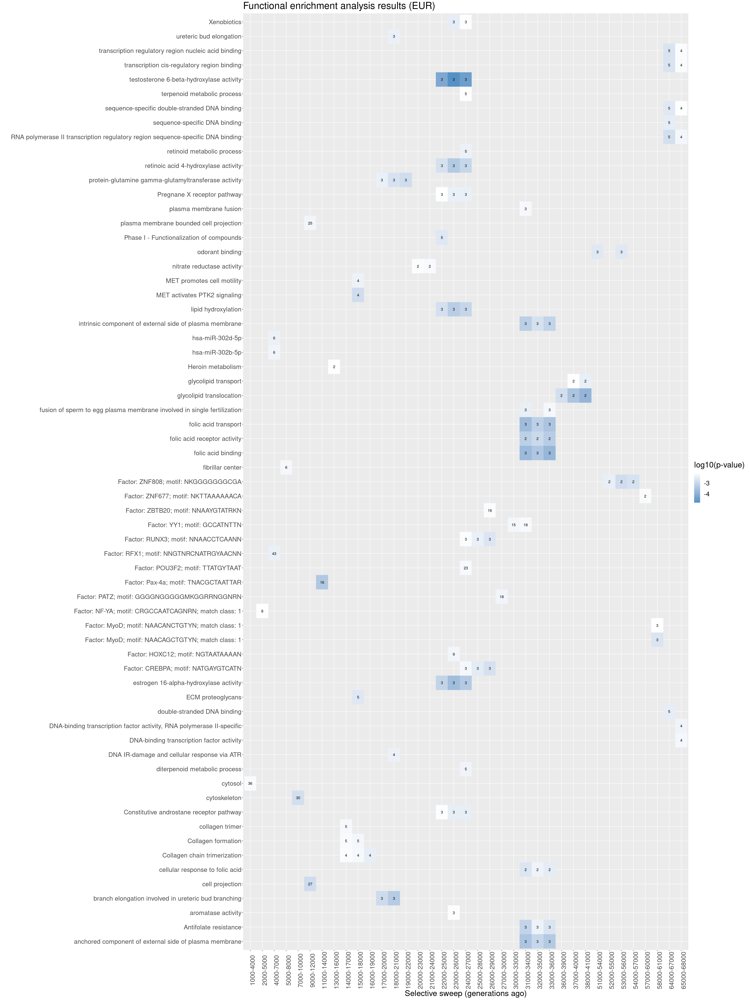

In [31]:
#Un llistat dels intervals possibles per ordenar l'eix
intervals <- c(0:100) * 1000
llistat <- c()
for (n in 4:length(intervals)) {
    llistat[n-3] <- paste(intervals[n-3], intervals[n], sep = '-') #Els as.integer són per evitar la notació científica al número 100.000
}
GOresult1000_EUR <- GOresultEUR %>% filter(p_value < 0.01) %>% separate(query, sep = ":", into = c("metapop", "generations")) %>% select(generations, p_value, intersection_size, term_name) %>% 
    unique(by = c('term_name', 'generations')) #Faig el distinct perquè, en un cas, hi ha un term (allograff_rejection) que es comparteix en varies fonts i hi ha repetició
#Em quedo amb els intervals (ordenats) on s'hagi detectat algo
llistat <- llistat[llistat %in% GOresult1000_EUR$generations]
options(repr.plot.width = 30, repr.plot.height = 40, warn = 1)
GOresult1000_EUR %>% ggplot(aes(x = generations, y = term_name)) + geom_tile(aes(fill = log10(p_value))) + 
    geom_text(aes(label = intersection_size)) +
    scale_fill_gradient(low = "#5691C4", high = "white") +
    theme(text = element_text(size = 23), axis.text.x = element_text(angle = 90)) + 
    labs(x='Selective sweep (generations ago)', y='', title = 'Functional enrichment analysis results (EUR)', fill = 'log10(p-value)') +
    scale_x_discrete(limits = llistat)

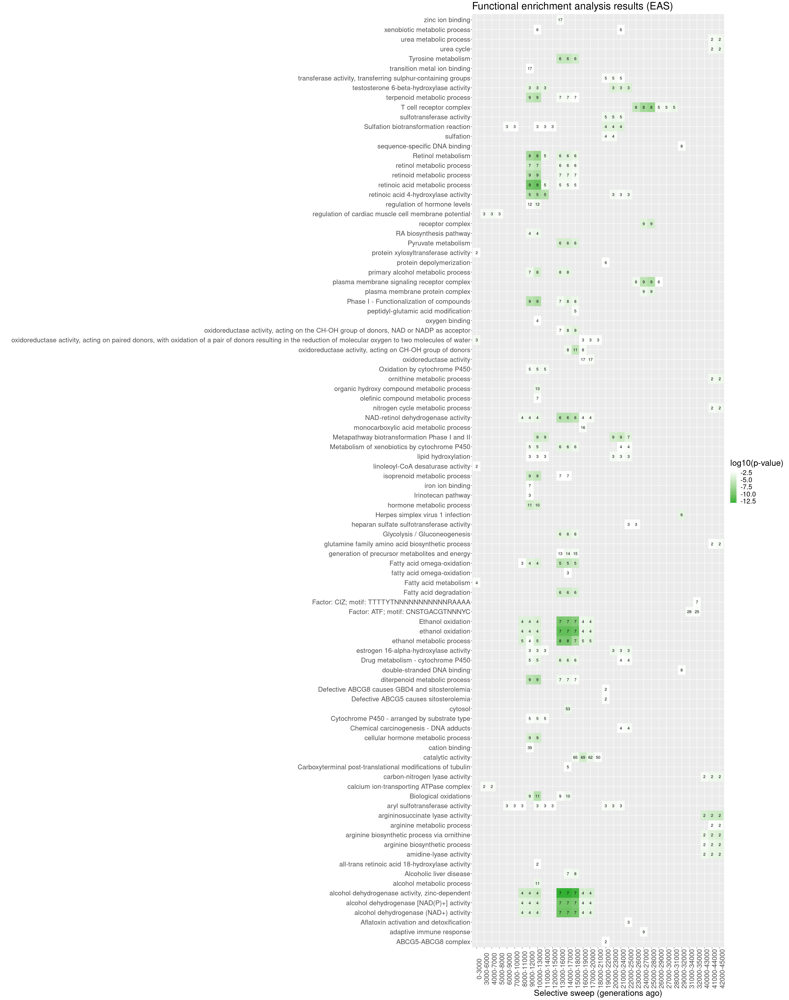

In [30]:
#Un llistat dels intervals possibles per ordenar l'eix
intervals <- c(0:100) * 1000
llistat <- c()
for (n in 4:length(intervals)) {
    llistat[n-3] <- paste(intervals[n-3], intervals[n], sep = '-') #Els as.integer són per evitar la notació científica al número 100.000
}
GOresult1000_EAS <- GOresultEAS %>% filter(p_value < 0.01) %>% separate(query, sep = ":", into = c("metapop", "generations")) %>% select(generations, p_value, intersection_size, term_name) %>% 
    unique(by = c('term_name', 'generations')) #Faig el distinct perquè, en un cas, hi ha un term (allograff_rejection) que es comparteix en varies fonts i hi ha repetició
#Em quedo amb els intervals (ordenats) on s'hagi detectat algo
llistat <- llistat[llistat %in% GOresult1000_EAS$generations]
options(repr.plot.width = 30, repr.plot.height = 38, warn = 1)
GOresult1000_EAS %>% ggplot(aes(x = generations, y = term_name)) + geom_tile(aes(fill = log10(p_value))) + 
    geom_text(aes(label = intersection_size)) +
    scale_fill_gradient(low = "#33B033", high = "white") +
    theme(text = element_text(size = 23), axis.text.x = element_text(angle = 90)) + 
    labs(x='Selective sweep (generations ago)', y='', title = 'Functional enrichment analysis results (EAS)', fill = 'log10(p-value)') +
    scale_x_discrete(limits = llistat)

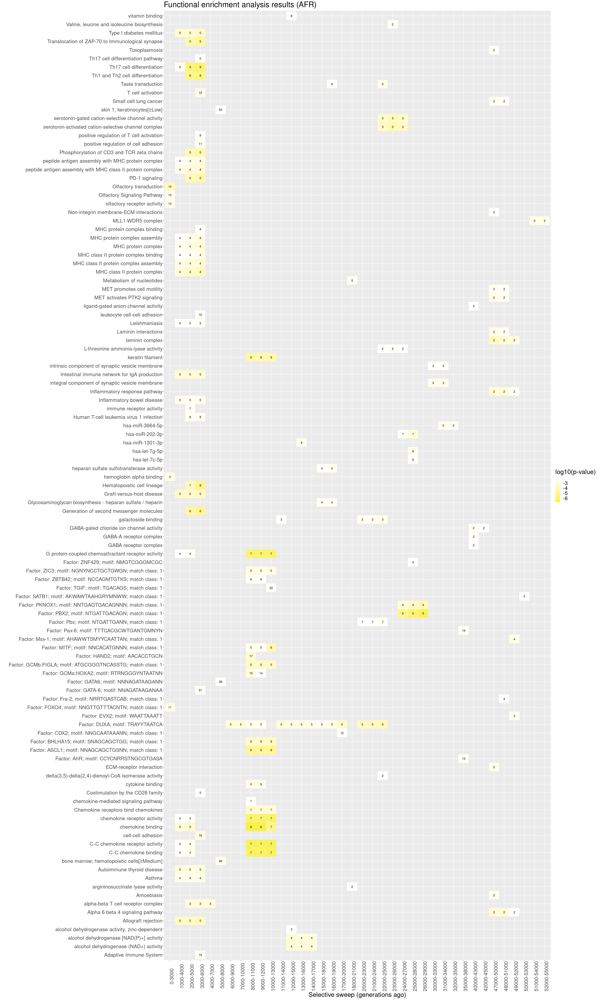

In [29]:
#Un llistat dels intervals possibles per ordenar l'eix
intervals <- c(0:100) * 1000
llistat <- c()
for (n in 4:length(intervals)) {
    llistat[n-3] <- paste(intervals[n-3], intervals[n], sep = '-') #Els as.integer són per evitar la notació científica al número 100.000
}
GOresult1000_AFR <- GOresultAFR %>% filter(p_value < 0.01) %>% separate(query, sep = ":", into = c("metapop", "generations")) %>% select(generations, p_value, intersection_size, term_name) %>% 
    unique(by = c('term_name', 'generations')) #Faig el distinct perquè, en un cas, hi ha un term (allograff_rejection) que es comparteix en varies fonts i hi ha repetició
#Em quedo amb els intervals (ordenats) on s'hagi detectat algo
llistat <- llistat[llistat %in% GOresult1000_AFR$generations]
options(repr.plot.width = 30, repr.plot.height = 50, warn = 1)
GOresult1000_AFR %>% ggplot(aes(x = generations, y = term_name)) + geom_tile(aes(fill = log10(p_value))) + 
    geom_text(aes(label = intersection_size)) +
    scale_fill_gradient(low = "#F7F14A", high = "white") +
    theme(text = element_text(size = 23), axis.text.x = element_text(angle = 90)) + 
    labs(x='Selective sweep (generations ago)', y='', title = 'Functional enrichment analysis results (AFR)', fill = 'log10(p-value)') +
    scale_x_discrete(limits = llistat)

### Resultats

In [25]:
GOresultAFR <- fread("/home/anoguera/Data/resultatsGO_regions_ihs/AFR1000top5_solapant.csv")
GOresultEUR <- fread("/home/anoguera/Data/resultatsGO_regions_ihs/EUR1000top5_solapant.csv")
GOresultEAS <- fread("/home/anoguera/Data/resultatsGO_regions_ihs/EAS1000top5_solapant.csv")
GOresultSAS <- fread("/home/anoguera/Data/resultatsGO_regions_ihs/SAS1000top5_solapant.csv")
GOresultAMR <- fread("/home/anoguera/Data/resultatsGO_regions_ihs/AMR1000top5_solapant.csv")

In [27]:
head(GOresultAFR %>% filter(intersection_size == 1))

query,significant,p_value,term_size,query_size,intersection_size,precision,recall,term_id,source,term_name,effective_domain_size,source_order,parents,evidence_codes,intersection
<chr>,<lgl>,<dbl>,<int>,<int>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>
AFR:29000-32000,TRUE,0.04967062,2,2,1,0.5,0.5,CORUM:3087,CORUM,CCND1-CDK6 complex,3627,1387,CORUM:0000000,CORUM,ENSG00000105810
AFR:29000-32000,TRUE,0.04967062,2,2,1,0.5,0.5,CORUM:3088,CORUM,CCND2-CDK6 complex,3627,1388,CORUM:0000000,CORUM,ENSG00000105810
AFR:29000-32000,TRUE,0.04967062,2,2,1,0.5,0.5,CORUM:3089,CORUM,CCND3-CDK6 complex,3627,1389,CORUM:0000000,CORUM,ENSG00000105810
AFR:36000-39000,TRUE,0.04987792,1,5,1,0.2,1.0,GO:0097541,GO:CC,axonemal basal plate,21698,3400,GO:0005930|GO:0110165,IBA IEA,ENSG00000143951
AFR:36000-39000,TRUE,0.04994622,1,5,1,0.2,1.0,GO:0047860,GO:MF,diiodophenylpyruvate reductase activity,20183,8219,GO:0016616,IEA,ENSG00000014641
AFR:37000-40000,TRUE,0.04967062,2,2,1,0.5,0.5,CORUM:721,CORUM,PU.1-TBP complex,3627,391,CORUM:0000000,CORUM,ENSG00000066336


## Representació en heat map (filtrant els clusters de gens)

In [2]:
GOresultAFR <- fread("/home/anoguera/Data/resultatsGO_regions_ihs/AFR1000top5.csv")
GOresultEUR <- fread("/home/anoguera/Data/resultatsGO_regions_ihs/EUR1000top5.csv")
GOresultEAS <- fread("/home/anoguera/Data/resultatsGO_regions_ihs/EAS1000top5.csv")
GOresultSAS <- fread("/home/anoguera/Data/resultatsGO_regions_ihs/SAS1000top5.csv")
GOresultAMR <- fread("/home/anoguera/Data/resultatsGO_regions_ihs/AMR1000top5.csv")

In [3]:
#La taula per saber de quina regió és cada gen
genes_table <- fread("/home/anoguera/Data/genes_table_top5_ihs.csv")
head(genes_table)

Metapop,Interval,Regions,Genes
<chr>,<chr>,<chr>,<chr>
AFR,0-1000,1:102676277:102875464,ENSG00000233359
AFR,0-1000,2:176514704:176735015,ENSG00000223976
AFR,0-1000,3:132936047:133111155,"ENSG00000144868,ENSG00000251011"
AFR,0-1000,3:159961246:160197411,"ENSG00000248710,ENSG00000068885,ENSG00000243687,ENSG00000113810,ENSG00000207779,ENSG00000198987,ENSG00000213186,ENSG00000244009,ENSG00000238427"
AFR,0-1000,3:160391591:160622570,"ENSG00000179674,ENSG00000207084,ENSG00000260572,ENSG00000163590"
AFR,0-1000,4:83285621:83403297,"ENSG00000138668,ENSG00000272677,ENSG00000250325,ENSG00000202440,ENSG00000152795,ENSG00000145293"


In [20]:
head(GOresultAFR, n=3)

query,significant,p_value,term_size,query_size,intersection_size,precision,recall,term_id,source,term_name,effective_domain_size,source_order,parents,evidence_codes,intersection
<chr>,<lgl>,<dbl>,<int>,<int>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>
0-1000,TRUE,2.039155e-08,399,52,13,0.25,0.03258145,GO:0050911,GO:BP,detection of chemical stimulus involved in sensory perception of smell,21100,15424,GO:0007608|GO:0050907,"IEA,IEA,IEA,IEA,IEA,IEA,IEA,IEA,IEA,IEA,IEA,IEA,IEA","ENSG00000205497,ENSG00000205496,ENSG00000176798,ENSG00000205495,ENSG00000176787,ENSG00000183251,ENSG00000167355,ENSG00000176239,ENSG00000184698,ENSG00000167360,ENSG00000167359,ENSG00000187918,ENSG00000181609"
0-1000,TRUE,4.615085e-08,426,52,13,0.25,0.03051643,GO:0007608,GO:BP,sensory perception of smell,21100,3469,GO:0007606,"IEA,IEA,IEA,IEA,IEA,NAS IEA,NAS IEA,NAS IEA,NAS IEA,IEA,NAS IEA,NAS IEA,NAS IEA","ENSG00000205497,ENSG00000205496,ENSG00000176798,ENSG00000205495,ENSG00000176787,ENSG00000183251,ENSG00000167355,ENSG00000176239,ENSG00000184698,ENSG00000167360,ENSG00000167359,ENSG00000187918,ENSG00000181609"
0-1000,TRUE,7.935996e-08,445,52,13,0.25,0.02921348,GO:0050907,GO:BP,detection of chemical stimulus involved in sensory perception,21100,15420,GO:0007606|GO:0009593|GO:0050906,"IEA,IEA,IEA,IEA,IEA,IEA,IEA,IEA,IEA,IEA,IEA,IEA,IEA","ENSG00000205497,ENSG00000205496,ENSG00000176798,ENSG00000205495,ENSG00000176787,ENSG00000183251,ENSG00000167355,ENSG00000176239,ENSG00000184698,ENSG00000167360,ENSG00000167359,ENSG00000187918,ENSG00000181609"


In [4]:
#Ara falta eliminar els resultats on tots els gens provinguin d'un cluster (faré que el límit sigui que la meitat dels gens estiguin en la mateixa regió)
GOfilter <- function(GOresult, genes_table, metapop) {
    GOresult <- GOresult %>% mutate(keep = FALSE, num_regions = as.numeric(NA)) #Afegeixo una columna que decidirà si es manté o no el resultat (1 o 0)
    genes_table <- genes_table %>% filter(Metapop == metapop) #Només em fixo en les regions que s'hagin detectat per aquella metapoblació
    for (n in 1:nrow(GOresult)) {
        num <- GOresult$intersection_size[n] #nombre dels gens del resultat
        genes <- unlist(strsplit(GOresult$intersection[n], ',')) #vectors dels gens del resultat
        regions <- vector() #un vector on guardaré el rang de totes les regions on hi hagi algun dels gens del resultat en qüestió
        age <- GOresult$query[n] #Només ens hem de fixar en les regions d'aquell interval que continguin el gen
        genes_table_temp <- genes_table %>% filter(Interval == age)
        for (gene in genes) {
            regions <- append(regions, grep(x = genes_table_temp$Genes, pattern = gene))
        }
        GOresult[n, 'num_regions'] <- length(unique(regions))
        if (length(unique(regions)) > num/2) {
            GOresult[n, 'keep'] <- TRUE
        }
    }
    return(GOresult)
}

In [5]:
#Funció per representar els resultats de GO en heat maps
GOHeatMap <- function(GOresult, metapop, color, p_val, height, width = 30, taula_gens = genes_table) {
    #Introduir els resultats, la metapoblació corresponent i el seu color, el p_valor màxim, la mida de la imatge desitjada i la taula de gens/regions
    intervals <- c(0:100) * 1000
    llistat <- c()
    for (n in 2:length(intervals)) {
        llistat[n-1] <- paste(intervals[n-1], intervals[n], sep = '-') #Els as.integer són per evitar la notació científica al número 100.000
    }
    GOresult1000 <- GOfilter(GOresult, taula_gens, metapop) %>% filter(keep == TRUE & p_value <= p_val) %>% select(query, p_value, intersection_size, term_name) %>% 
    unique(by = c('term_name', 'query')) #Faig el distinct perquè, en un cas, hi ha un term (allograff_rejection) que es comparteix en varies fonts i hi ha repetició
    #Em quedo amb els intervals (ordenats) on s'hagi detectat algo
    llistat <- llistat[llistat %in% GOresult1000$query]
    options(repr.plot.width = width, repr.plot.height = height, warn = 1)
    HeatMap <- GOresult1000 %>% ggplot(aes(x = query, y = term_name)) + geom_tile(aes(fill = log10(p_value))) + 
    geom_text(aes(label = intersection_size)) +
    scale_fill_gradient(low = color, high = "white") +
    theme(text = element_text(size = 23), axis.text.x = element_text(angle = 90)) + 
    labs(x='Selective sweep (generations ago)', y='', title = paste0('Functional enrichment analysis results (', metapop, ')'), fill = 'log10(p-value)') +
    scale_x_discrete(limits = llistat)
    return(HeatMap)
}

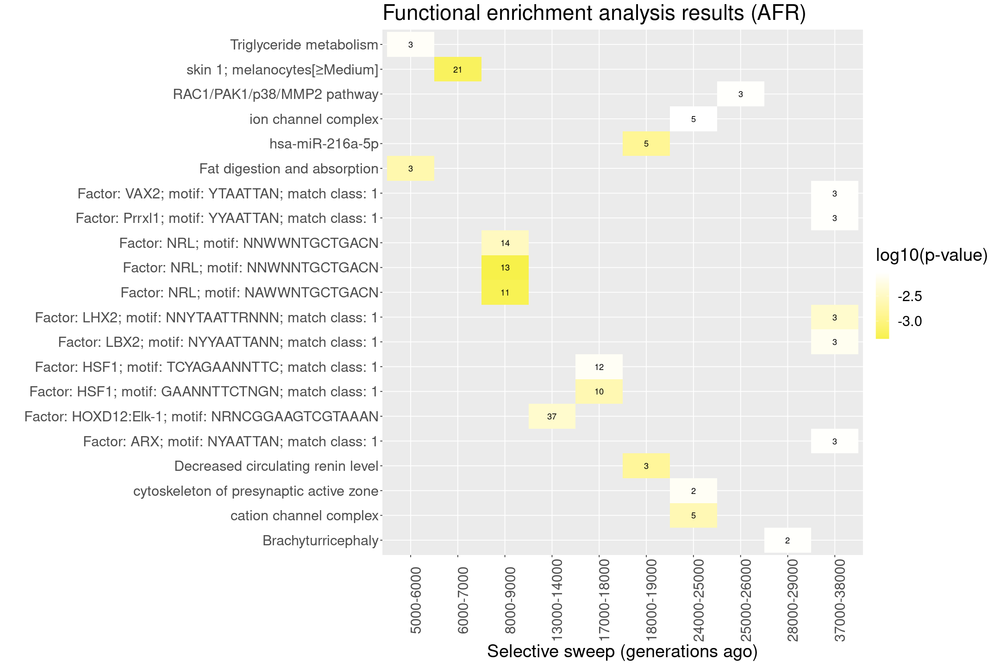

In [18]:
GOHeatMap(GOresultAFR, 'AFR', '#F7F14A', 0.01, height = 12, width = 18)

In [92]:
GOfilter(GOresultAFR, genes_table, 'AFR')[grep(pattern = 'skin 1; melanocytes', x = GOresultAFR$term_name),]

query,significant,p_value,term_size,query_size,intersection_size,precision,recall,term_id,source,term_name,effective_domain_size,source_order,parents,evidence_codes,intersection,keep,num_regions
<chr>,<lgl>,<dbl>,<int>,<int>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<lgl>,<dbl>
6000-7000,TRUE,0.0005768724,3685,27,21,0.7777778,0.005698779,HPA:0460672,HPA,skin 1; melanocytes[≥Medium],10976,643,HPA:0460671,"Approved,Approved,Approved,Enhanced,Supported,Approved,Approved,Approved,Enhanced,Approved,Enhanced,Approved,Approved,Enhanced,Enhanced,Enhanced,Supported,Supported,Approved,Approved,Supported","ENSG00000138031,ENSG00000115839,ENSG00000172113,ENSG00000164050,ENSG00000164051,ENSG00000164053,ENSG00000138785,ENSG00000163104,ENSG00000157107,ENSG00000157111,ENSG00000122335,ENSG00000130338,ENSG00000158321,ENSG00000185963,ENSG00000033327,ENSG00000182185,ENSG00000090861,ENSG00000142453,ENSG00000130733,ENSG00000142444,ENSG00000127616",TRUE,14


In [93]:
genes_table[grep(pattern='ENSG00000138031|ENSG00000115839|ENSG00000172113|ENSG00000164050|ENSG00000164051|ENSG00000164053|ENSG00000138785|ENSG00000163104|ENSG00000157107|ENSG00000157111|ENSG00000122335|ENSG00000130338|ENSG00000158321|ENSG00000185963|ENSG00000033327|ENSG00000182185|ENSG00000090861|ENSG00000142453|ENSG00000130733|ENSG00000142444|ENSG00000127616', x=genes_table$Genes),] %>% filter(Metapop == 'AFR')

Metapop,Interval,Regions,Genes
<chr>,<chr>,<chr>,<chr>
AFR,0-1000,6:158448275:158602211,"ENSG00000078269,ENSG00000122335,ENSG00000272047,ENSG00000265803"
AFR,2000-3000,2:135717740:135945940,"ENSG00000176601,ENSG00000115839,ENSG00000238337,ENSG00000208308,ENSG00000121988"
AFR,2000-3000,3:48273631:48448914,"ENSG00000164048,ENSG00000229759,ENSG00000199476,ENSG00000228638,ENSG00000172113,ENSG00000229453,ENSG00000252466,ENSG00000164049,ENSG00000265053,ENSG00000164050"
AFR,3000-4000,2:135698075:135834910,"ENSG00000082258,ENSG00000176601,ENSG00000115839,ENSG00000238337"
AFR,4000-5000,4:95145800:95257753,"ENSG00000163104,ENSG00000163106"
AFR,5000-6000,4:106765915:106978715,"ENSG00000138785,ENSG00000138780,ENSG00000168743,ENSG00000250740,ENSG00000249635,ENSG00000145348"
AFR,6000-7000,2:24949602:25109154,"ENSG00000084676,ENSG00000184924,ENSG00000138092,ENSG00000138031,ENSG00000271936"
AFR,6000-7000,2:135760244:135954531,"ENSG00000176601,ENSG00000115839,ENSG00000238337,ENSG00000208308,ENSG00000121988"
AFR,6000-7000,3:48228294:48489860,"ENSG00000164045,ENSG00000265483,ENSG00000164047,ENSG00000164048,ENSG00000229759,ENSG00000199476,ENSG00000228638,ENSG00000172113,ENSG00000229453,ENSG00000252466,ENSG00000164049,ENSG00000265053,ENSG00000164050,ENSG00000164051,ENSG00000232112,ENSG00000244380,ENSG00000164053"


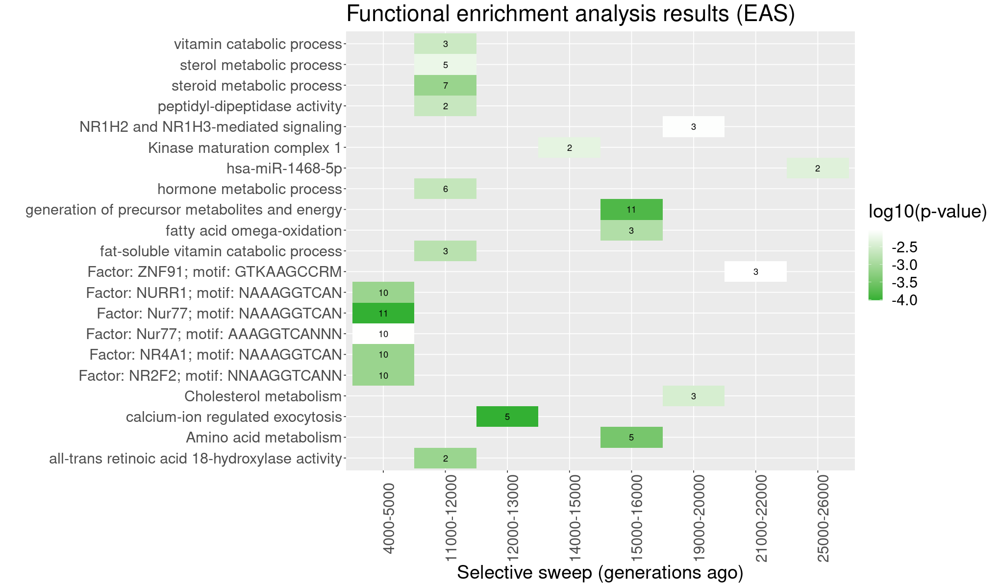

In [56]:
GOHeatMap(GOresultEAS, 'EAS', '#33B033', 0.01, height = 10, width = 17)

In [8]:
GOfilter(GOresultEAS, genes_table, 'EAS')[grep(pattern = 'calcium-ion regulated exocytosis', x = GOresultEAS$term_name),]

query,significant,p_value,term_size,query_size,intersection_size,precision,recall,term_id,source,term_name,effective_domain_size,source_order,parents,evidence_codes,intersection,keep,num_regions
<chr>,<lgl>,<dbl>,<int>,<int>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<lgl>,<dbl>
12000-13000,TRUE,9.751531e-05,65,33,5,0.1515152,0.07692308,GO:0017156,GO:BP,calcium-ion regulated exocytosis,21100,5892,GO:0045055,"ISS,IEA,ISS IEA,IEA,ISS IBA IEA","ENSG00000115839,ENSG00000114353,ENSG00000186792,ENSG00000163618,ENSG00000176406",TRUE,4


In [12]:
genes_table[grep(pattern='ENSG00000115839|ENSG00000114353|ENSG00000186792|ENSG00000163618|ENSG00000176406', x=genes_table$Genes),] %>% filter(Metapop == 'EAS')

Metapop,Interval,Regions,Genes
<chr>,<chr>,<chr>,<chr>
EAS,3000-4000,3:50145370:50342621,"ENSG00000003756,ENSG00000235016,ENSG00000001617,ENSG00000207922,ENSG00000114349,ENSG00000188338,ENSG00000114353,ENSG00000213600,ENSG00000230454,ENSG00000232352,ENSG00000012171,ENSG00000179564,ENSG00000214706,ENSG00000186792,ENSG00000243477,ENSG00000114378"
EAS,7000-8000,3:50139142:50315502,"ENSG00000003756,ENSG00000235016,ENSG00000001617,ENSG00000207922,ENSG00000114349,ENSG00000188338,ENSG00000114353,ENSG00000213600,ENSG00000230454,ENSG00000232352,ENSG00000012171"
EAS,9000-10000,3:50165101:50323172,"ENSG00000235016,ENSG00000001617,ENSG00000207922,ENSG00000114349,ENSG00000188338,ENSG00000114353,ENSG00000213600,ENSG00000230454,ENSG00000232352,ENSG00000012171,ENSG00000179564"
EAS,12000-13000,2:135802050:135912255,"ENSG00000176601,ENSG00000115839,ENSG00000238337,ENSG00000208308,ENSG00000121988"
EAS,12000-13000,3:50128386:50334231,"ENSG00000004534,ENSG00000003756,ENSG00000235016,ENSG00000001617,ENSG00000207922,ENSG00000114349,ENSG00000188338,ENSG00000114353,ENSG00000213600,ENSG00000230454,ENSG00000232352,ENSG00000012171,ENSG00000179564,ENSG00000214706,ENSG00000186792,ENSG00000243477"
EAS,12000-13000,3:62632106:62743234,ENSG00000163618
EAS,12000-13000,8:104568972:104756061,"ENSG00000176406,ENSG00000255105,ENSG00000254644,ENSG00000238687"
EAS,28000-29000,8:104576067:104813430,"ENSG00000176406,ENSG00000254644,ENSG00000238687,ENSG00000239344"
EAS,32000-33000,8:104516401:104693685,"ENSG00000176406,ENSG00000255105,ENSG00000254644,ENSG00000238687"


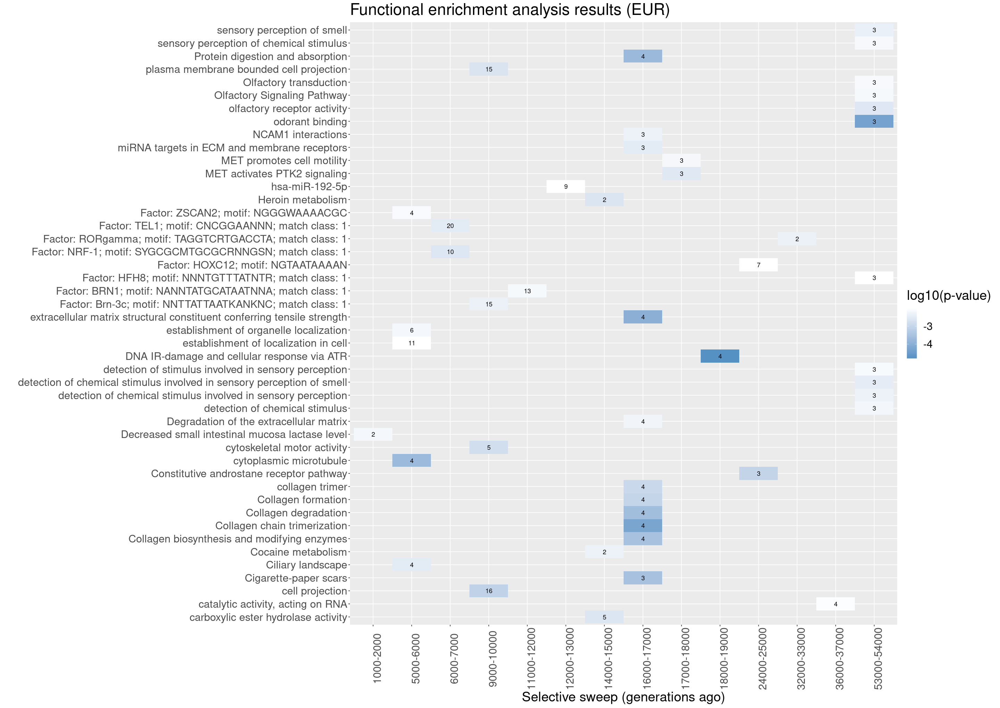

In [59]:
GOHeatMap(GOresultEUR, 'EUR', '#5691C4', 0.01, height = 17, width = 24)

In [6]:
GOfilter(GOresultEUR, genes_table, 'EUR')[grep(pattern = 'via ATR', x = GOresultEUR$term_name),]

query,significant,p_value,term_size,query_size,intersection_size,precision,recall,term_id,source,term_name,effective_domain_size,source_order,parents,evidence_codes,intersection,keep,num_regions
<chr>,<lgl>,<dbl>,<int>,<int>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<lgl>,<dbl>
18000-19000,TRUE,1.592255e-05,78,6,4,0.6666667,0.05128205,WP:WP4016,WP,DNA IR-damage and cellular response via ATR,7364,733,WP:000000,"WP,WP,WP,WP","ENSG00000092853,ENSG00000109332,ENSG00000147316,ENSG00000170836",TRUE,4


In [7]:
genes_table[grep(pattern='ENSG00000092853|ENSG00000109332|ENSG00000147316|ENSG00000170836', x=genes_table$Genes),] %>% filter(Metapop == 'EUR')

Metapop,Interval,Regions,Genes
<chr>,<chr>,<chr>,<chr>
EUR,11000-12000,1:36074754:36285870,"ENSG00000126067,ENSG00000239859,ENSG00000142686,ENSG00000092853,ENSG00000232335,ENSG00000134698"
EUR,17000-18000,17:58740077:58967785,"ENSG00000170836,ENSG00000141376,ENSG00000239932,ENSG00000224011,ENSG00000252534,ENSG00000267083,ENSG00000211515,ENSG00000254114"
EUR,18000-19000,1:36125485:36242004,"ENSG00000239859,ENSG00000142686,ENSG00000092853,ENSG00000232335"
EUR,18000-19000,4:103788211:103969374,"ENSG00000109332,ENSG00000145354,ENSG00000164037,ENSG00000250651,ENSG00000249283,ENSG00000164038"
EUR,18000-19000,8:6128562:6319763,"ENSG00000246089,ENSG00000147316"
EUR,18000-19000,17:58618378:59020227,"ENSG00000259349,ENSG00000267678,ENSG00000267772,ENSG00000266943,ENSG00000170836,ENSG00000200013,ENSG00000141376,ENSG00000239932,ENSG00000224011,ENSG00000252534,ENSG00000267083,ENSG00000211515,ENSG00000254114,ENSG00000264322"
EUR,25000-26000,17:58732565:59011296,"ENSG00000170836,ENSG00000200013,ENSG00000141376,ENSG00000239932,ENSG00000224011,ENSG00000252534,ENSG00000267083,ENSG00000211515,ENSG00000254114,ENSG00000264322"
EUR,50000-51000,17:58740228:58901973,"ENSG00000170836,ENSG00000141376,ENSG00000239932,ENSG00000224011,ENSG00000252534,ENSG00000267083,ENSG00000211515"
EUR,52000-53000,17:58740077:58958686,"ENSG00000170836,ENSG00000141376,ENSG00000239932,ENSG00000224011,ENSG00000252534,ENSG00000267083,ENSG00000211515,ENSG00000254114"


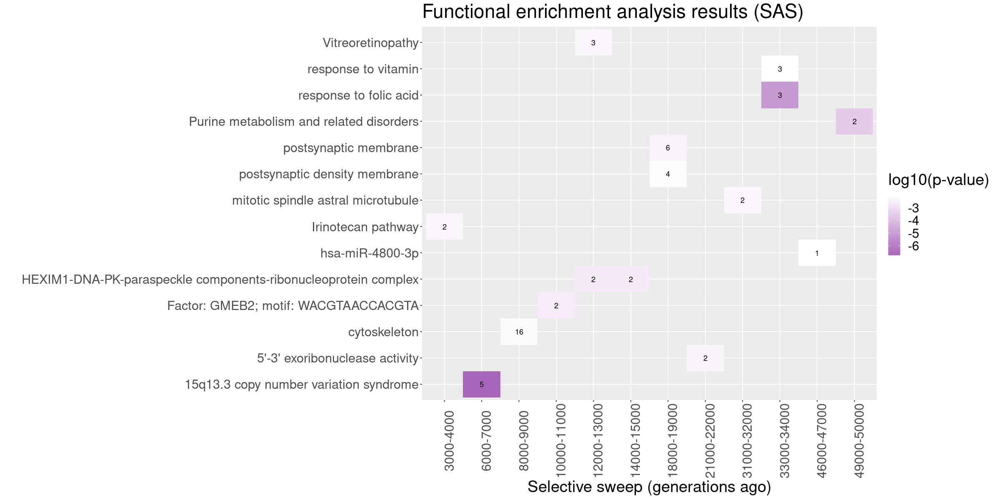

In [61]:
GOHeatMap(GOresultSAS, 'SAS', '#A965BA', 0.01, height = 10, width = 20)

In [85]:
GOfilter(GOresultSAS, genes_table, 'SAS')[grep(pattern = '15q13.3', x = GOresultSAS$term_name),]

query,significant,p_value,term_size,query_size,intersection_size,precision,recall,term_id,source,term_name,effective_domain_size,source_order,parents,evidence_codes,intersection,keep,num_regions
<chr>,<lgl>,<dbl>,<int>,<int>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<lgl>,<dbl>
6000-7000,TRUE,1.822898e-07,16,26,5,0.1923077,0.3125,WP:WP4942,WP,15q13.3 copy number variation syndrome,7364,122,WP:000000,"WP,WP,WP,WP,WP","ENSG00000144554,ENSG00000198690,ENSG00000166912,ENSG00000134160,ENSG00000169918",TRUE,3


In [91]:
genes_table[grep(pattern='ENSG00000144554|ENSG00000198690|ENSG00000166912|ENSG00000134160|ENSG00000169918', x=genes_table$Genes),] %>% filter(Metapop == 'SAS')

Metapop,Interval,Regions,Genes
<chr>,<chr>,<chr>,<chr>
SAS,6000-7000,3:9942234:10188428,"ENSG00000163701,ENSG00000163702,ENSG00000212327,ENSG00000163703,ENSG00000269894,ENSG00000163704,ENSG00000230082,ENSG00000269982,ENSG00000125037,ENSG00000180385,ENSG00000232901,ENSG00000206567,ENSG00000186162,ENSG00000144554,ENSG00000201182,ENSG00000229217,ENSG00000163705,ENSG00000254999,ENSG00000238642,ENSG00000134086,ENSG00000238345"
SAS,6000-7000,15:31197564:31316015,"ENSG00000198690,ENSG00000270015,ENSG00000166912,ENSG00000212526,ENSG00000134160,ENSG00000259720"
SAS,6000-7000,15:31826393:32036137,ENSG00000169918
SAS,8000-9000,15:31881405:32059936,"ENSG00000169918,ENSG00000259358"
SAS,16000-17000,3:9947704:10108745,"ENSG00000163701,ENSG00000163702,ENSG00000212327,ENSG00000163703,ENSG00000269894,ENSG00000163704,ENSG00000230082,ENSG00000269982,ENSG00000125037,ENSG00000180385,ENSG00000232901,ENSG00000206567,ENSG00000186162,ENSG00000144554,ENSG00000201182,ENSG00000229217"
SAS,19000-20000,3:9926010:10189052,"ENSG00000171135,ENSG00000163701,ENSG00000163702,ENSG00000212327,ENSG00000163703,ENSG00000269894,ENSG00000163704,ENSG00000230082,ENSG00000269982,ENSG00000125037,ENSG00000180385,ENSG00000232901,ENSG00000206567,ENSG00000186162,ENSG00000144554,ENSG00000201182,ENSG00000229217,ENSG00000163705,ENSG00000254999,ENSG00000238642,ENSG00000134086,ENSG00000238345"
SAS,26000-27000,15:31863960:32051488,ENSG00000169918


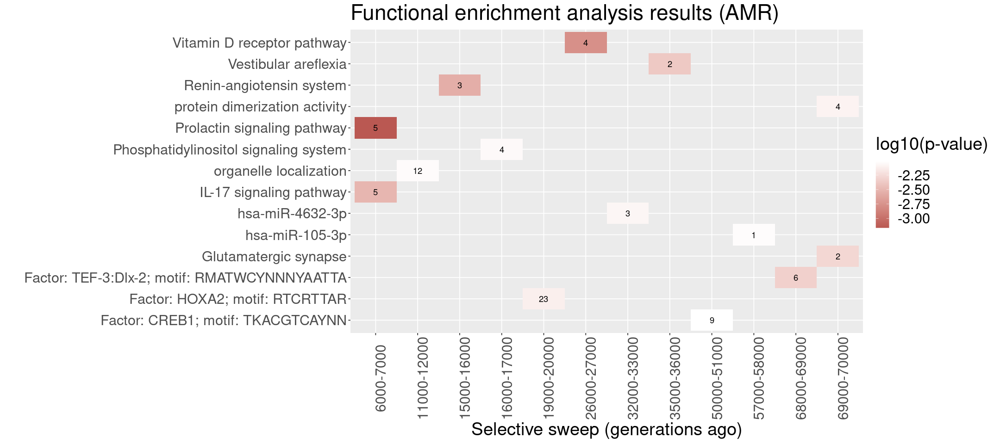

In [63]:
GOHeatMap(GOresultAMR, 'AMR', '#BA5852', 0.01, height = 8, width = 18)

In [14]:
GOfilter(GOresultAMR, genes_table, 'AMR')[grep(pattern = 'Prolactin signaling', x = GOresultAMR$term_name),]

query,significant,p_value,term_size,query_size,intersection_size,precision,recall,term_id,source,term_name,effective_domain_size,source_order,parents,evidence_codes,intersection,keep,num_regions
<chr>,<lgl>,<dbl>,<int>,<int>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<lgl>,<dbl>
6000-7000,TRUE,0.000688420,67,33,5,0.1515152,0.07462687,KEGG:04917,KEGG,Prolactin signaling pathway,7559,356,KEGG:00000,"KEGG,KEGG,KEGG,KEGG,KEGG","ENSG00000082701,ENSG00000113494,ENSG00000107643,ENSG00000173039,ENSG00000185338",TRUE,6
6000-7000,TRUE,0.002466701,75,34,5,0.1470588,0.06666667,WP:WP2037,WP,Prolactin signaling pathway,7364,285,WP:000000,"WP,WP,WP,WP,WP","ENSG00000082701,ENSG00000113494,ENSG00000107643,ENSG00000173039,ENSG00000185338",TRUE,6


In [16]:
genes_table[grep(pattern='ENSG00000082701|ENSG00000113494|ENSG00000107643|ENSG00000173039|ENSG00000185338', x=genes_table$Genes),] %>% filter(Metapop == 'AMR')

Metapop,Interval,Regions,Genes
<chr>,<chr>,<chr>,<chr>
AMR,6000-7000,3:119562794:119710179,ENSG00000082701
AMR,6000-7000,5:35045127:35187180,"ENSG00000113492,ENSG00000113494,ENSG00000269027,ENSG00000250886"
AMR,6000-7000,10:49476916:49637179,"ENSG00000170324,ENSG00000225482,ENSG00000107643"
AMR,6000-7000,11:65368434:65549415,"ENSG00000173327,ENSG00000197136,ENSG00000266041,ENSG00000213445,ENSG00000265874,ENSG00000173039,ENSG00000239356,ENSG00000172977,ENSG00000172922,ENSG00000214659,ENSG00000255557,ENSG00000254470,ENSG00000175827"
AMR,6000-7000,11:65334712:65571524,"ENSG00000260233,ENSG00000173465,ENSG00000176973,ENSG00000173442,ENSG00000269018,ENSG00000173338,ENSG00000173327,ENSG00000197136,ENSG00000266041,ENSG00000213445,ENSG00000265874,ENSG00000173039,ENSG00000239356,ENSG00000172977,ENSG00000172922,ENSG00000214659,ENSG00000255557,ENSG00000254470,ENSG00000175827,ENSG00000172818,ENSG00000255120,ENSG00000255404"
AMR,6000-7000,16:11337721:11527995,"ENSG00000175643,ENSG00000185338,ENSG00000178279,ENSG00000178257,ENSG00000212228,ENSG00000122304,ENSG00000175646,ENSG00000238409,ENSG00000221801,ENSG00000199668,ENSG00000263080,ENSG00000262703,ENSG00000238774,ENSG00000188897,ENSG00000262636"
AMR,17000-18000,16:10923594:11652780,"ENSG00000262488,ENSG00000262151,ENSG00000179583,ENSG00000182108,ENSG00000263013,ENSG00000262222,ENSG00000038532,ENSG00000229917,ENSG00000262020,ENSG00000263033,ENSG00000263179,ENSG00000175643,ENSG00000185338,ENSG00000178279,ENSG00000178257,ENSG00000212228,ENSG00000122304,ENSG00000175646,ENSG00000238409,ENSG00000221801,ENSG00000199668,ENSG00000263080,ENSG00000262703,ENSG00000238774,ENSG00000188897,ENSG00000262636,ENSG00000262999,ENSG00000272310,ENSG00000265731,ENSG00000189067"


In [19]:
installed.packages()

,Package,LibPath,Version,Priority,Depends,Imports,LinkingTo,Suggests,Enhances,License,License_is_FOSS,License_restricts_use,OS_type,MD5sum,NeedsCompilation,Built
abind,abind,/home/anoguera/R/x86_64-redhat-linux-gnu-library/3.6,1.4-5,NA,R (>= 1.5.0),"methods, utils",NA,NA,NA,LGPL (>= 2),NA,NA,NA,NA,no,3.6.0
ALL,ALL,/home/anoguera/R/x86_64-redhat-linux-gnu-library/3.6,1.28.0,NA,"R (>= 2.10), Biobase (>= 2.5.5)",NA,NA,rpart,NA,Artistic-2.0,NA,NA,NA,NA,no,3.6.0
AnnotationDbi,AnnotationDbi,/home/anoguera/R/x86_64-redhat-linux-gnu-library/3.6,1.48.0,NA,"R (>= 2.7.0), methods, utils, stats4, BiocGenerics (>= 0.29.2), Biobase (>= 1.17.0), IRanges","DBI, RSQLite, S4Vectors (>= 0.9.25)",NA,"hgu95av2.db, GO.db, org.Sc.sgd.db, org.At.tair.db, KEGG.db, RUnit, TxDb.Hsapiens.UCSC.hg19.knownGene, hom.Hs.inp.db, org.Hs.eg.db, reactome.db, AnnotationForge, graph, EnsDb.Hsapiens.v75, BiocStyle, knitr",NA,Artistic-2.0,NA,NA,NA,NA,no,3.6.0
bdsmatrix,bdsmatrix,/home/anoguera/R/x86_64-redhat-linux-gnu-library/3.6,1.3-6,NA,"methods, R (>= 2.0.0)",NA,NA,NA,NA,LGPL-2,NA,NA,NA,NA,yes,3.6.0
Biobase,Biobase,/home/anoguera/R/x86_64-redhat-linux-gnu-library/3.6,2.46.0,NA,"R (>= 2.10), BiocGenerics (>= 0.27.1), utils",methods,NA,"tools, tkWidgets, ALL, RUnit, golubEsets",NA,Artistic-2.0,NA,NA,NA,NA,yes,3.6.0
BiocFileCache,BiocFileCache,/home/anoguera/R/x86_64-redhat-linux-gnu-library/3.6,1.10.2,NA,"R (>= 3.4.0), dbplyr (>= 1.0.0)","methods, stats, utils, dplyr, RSQLite, DBI, rappdirs, curl, httr",NA,"testthat, knitr, BiocStyle, rmarkdown, rtracklayer",NA,Artistic-2.0,NA,NA,NA,NA,no,3.6.0
BiocGenerics,BiocGenerics,/home/anoguera/R/x86_64-redhat-linux-gnu-library/3.6,0.32.0,NA,"R (>= 3.6.0), methods, utils, graphics, stats, parallel","methods, utils, graphics, stats, parallel",NA,"Biobase, S4Vectors, IRanges, GenomicRanges, DelayedArray, Biostrings, Rsamtools, AnnotationDbi, oligoClasses, oligo, affyPLM, flowClust, affy, DESeq2, MSnbase, annotate, RUnit",NA,Artistic-2.0,NA,NA,NA,NA,no,3.6.0
BiocManager,BiocManager,/home/anoguera/R/x86_64-redhat-linux-gnu-library/3.6,1.30.18,NA,NA,utils,NA,"BiocVersion, remotes, rmarkdown, testthat, withr, curl, knitr",NA,Artistic-2.0,NA,NA,NA,NA,no,3.6.0
BiocParallel,BiocParallel,/home/anoguera/R/x86_64-redhat-linux-gnu-library/3.6,1.20.1,NA,methods,"stats, utils, futile.logger, parallel, snow",BH,"BiocGenerics, tools, foreach, BatchJobs, BBmisc, doParallel, Rmpi, GenomicRanges, RNAseqData.HNRNPC.bam.chr14, TxDb.Hsapiens.UCSC.hg19.knownGene, VariantAnnotation, Rsamtools, GenomicAlignments, ShortRead, codetools, RUnit, BiocStyle, knitr, batchtools, data.table",NA,GPL-2 | GPL-3,NA,NA,NA,NA,yes,3.6.0
BiocVersion,BiocVersion,/home/anoguera/R/x86_64-redhat-linux-gnu-library/3.6,3.10.1,NA,R (>= 3.6.0),NA,NA,NA,NA,Artistic-2.0,NA,NA,NA,NA,no,3.6.0


In [6]:
R.version

               _                           
platform       x86_64-redhat-linux-gnu     
arch           x86_64                      
os             linux-gnu                   
system         x86_64, linux-gnu           
status                                     
major          3                           
minor          6.0                         
year           2019                        
month          04                          
day            26                          
svn rev        76424                       
language       R                           
version.string R version 3.6.0 (2019-04-26)
nickname       Planting of a Tree          